# Constrained Food Recommender

In this assignment, you will implement both Content Based and Collaborative Filtering Recommenders and backtracking search (or local search) on your own

100% finished homework should contain EDA, Item and User profiles generation, Content-Based Recommender, Collaborative Filtering Recommender, and soluton to CSP problem of assigning recommendations to brekfast, lunch and dinner.

### Imports

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import folium
import json

sns.set(style="darkgrid", font_scale=1.2)
plt.rcParams['figure.figsize'] = [12, 6]
plt.rcParams['figure.dpi'] = 100

pd.set_option('display.max_columns', 50)

## Data loading

You will work with subset of [Academic Yelp Dataset](https://www.kaggle.com/yelp-dataset/yelp-dataset) containing list of restaurants in **yelp_business.csv** and reviews of the users in **yelp_reviews.parquet**

In [2]:
df_yelp_business = pd.read_csv("yelp_business.csv").drop(columns=["Unnamed: 0"])
df_yelp_reviews = pd.read_parquet("yelp_reviews.parquet")

# Leave only users with at least 3 reviews
users_count = df_yelp_reviews.groupby("user_id").count()[["business_id"]] 
users_to_use = users_count[users_count["business_id"] > 2]
df_yelp_reviews = df_yelp_reviews[df_yelp_reviews["user_id"].isin(users_to_use.index)]

## Exploratory data analysis

Here you will explore the data to find out what is the distribution of business categories, hours, places, user reviews, etc.

This step is needed to proceed later with item and user profiling and to clean your data if there are duplicates (e.g. duplicated reviews, the same businesses under different ids, categories tags which are highly correlated) or some artifacts not related to the main task.

(5 points)

In [3]:
df_yelp_business.head()

,address,attributes,business_id,categories,city,hours,is_open,latitude,longitude,name,postal_code,review_count,stars,state
0,404 E Green St,"{'RestaurantsAttire': ""u'casual'"", 'Restaurant...",pQeaRpvuhoEqudo3uymHIQ,"Ethnic Food, Food Trucks, Specialty Food, Impo...",Champaign,"{'Monday': '11:30-14:30', 'Tuesday': '11:30-14...",1,40.110446,-88.233073,The Empanadas House,61820,5,4.5,IL
1,4508 E Independence Blvd,"{'RestaurantsGoodForGroups': 'True', 'OutdoorS...",CsLQLiRoafpJPJSkNX2h5Q,"Food, Restaurants, Grocery, Middle Eastern",Charlotte,NaN,0,35.194894,-80.767442,Middle East Deli,28205,5,3.0,NC
2,300 John Street,"{'GoodForKids': 'True', 'RestaurantsTakeOut': ...",lu7vtrp_bE9PnxWfA8g4Pg,"Japanese, Fast Food, Food Court, Restaurants",Thornhill,NaN,1,43.820492,-79.398466,Banzai Sushi,L3T 5W4,7,4.5,ON
3,"4550 East Cactus Rd, #KSFC-4","{'GoodForKids': 'True', 'RestaurantsTakeOut': ...",vjTVxnsQEZ34XjYNS-XUpA,"Food, Pretzels, Bakeries, Fast Food, Restaurants",Phoenix,"{'Monday': '10:0-21:0', 'Tuesday': '10:0-21:0'...",1,33.602822,-111.983533,Wetzel's Pretzels,85032,10,4.0,AZ
4,9595 W Tropicana Ave,"{'Alcohol': ""u'none'"", 'WiFi': ""u'no'"", 'GoodF...",fnZrZlqW1Z8iWgTVDfv_MA,"Mexican, Restaurants, Fast Food",Las Vegas,NaN,0,36.099738,-115.301568,Carl's Jr,89147,15,2.5,NV


In [4]:
df_yelp_reviews.head()

,business_id,cool,date,funny,review_id,stars,text,useful,user_id
4,IS4cv902ykd8wj1TR0N3-A,0,2017-01-14 21:56:57,0,6TdNDKywdbjoTkizeMce8A,4,happy day finally canes near casa yes others g...,0,UgMW8bLE0QMJDCkQ1Ax5Mg
6,Pthe4qk5xh4n-ef-9bvMSg,0,2015-11-05 23:11:05,0,ZayJ1zWyWgY9S_TRLT_y9Q,5,really good place simple decor amazing food gr...,1,aq_ZxGHiri48TUXJlpRkCQ
9,Ws8V970-mQt2X9CwCuT5zw,1,2009-10-13 04:16:41,0,z4BCgTkfNtCu4XY5Lp97ww,4,twice nice laid back tried weekend southern me...,3,jOERvhmK6_lo_XGUBPws_w
16,d4qwVw4PcN-_2mK2o1Ro1g,0,2015-02-02 06:28:00,0,bVTjZgRNq8ToxzvtiVrqMA,1,10pm super bowl sunday already closed weak won...,0,2hRe26HSCAWbFRn5WChK-Q
22,9Jo1pu0y2zU6ktiwQm6gNA,20,2016-12-04 03:15:21,19,sgTnHfeaEvyOoWX4TCgkuQ,4,coconut fish cafe fantastic five stars fish ca...,24,A0j21z2Q1HGic7jW6e9h7A


### Find out business locations on the map

In [5]:
this_map = folium.Map(prefer_canvas=True)

def plotDot(point):
    folium.CircleMarker(location=[point.latitude, point.longitude], radius=2, weight=5).add_to(this_map)

df_yelp_business.apply(plotDot, axis=1)
this_map.fit_bounds(this_map.get_bounds())
this_map

In [6]:
states = list(df_yelp_business.state.unique())
print(f"Total states: {len(states)}. List: {', '.join(states)}")

Total states: 13. List: IL, NC, ON, AZ, NV, QC, OH, PA, AB, SC, WI, CO, XWY


### Find distribution of reviews for each business

Please note that the below plot is on logarithmic scale since the number of reviews decreases exponentially.  
**There are thousands of businesses with a few reviews and only a few businesses with thousands reviews.**

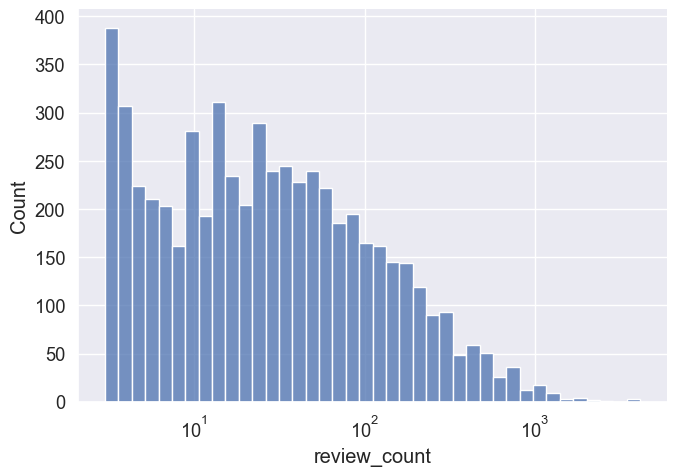

In [7]:
sns.displot(
  data=df_yelp_business,
  x='review_count',
  kind='hist',
  aspect=1.4,
  log_scale=10,
  bins=40
)

### Distribution of stars

It is rather intuitive that reviews are mostly normally distributed with a slight skew to a higher mark.

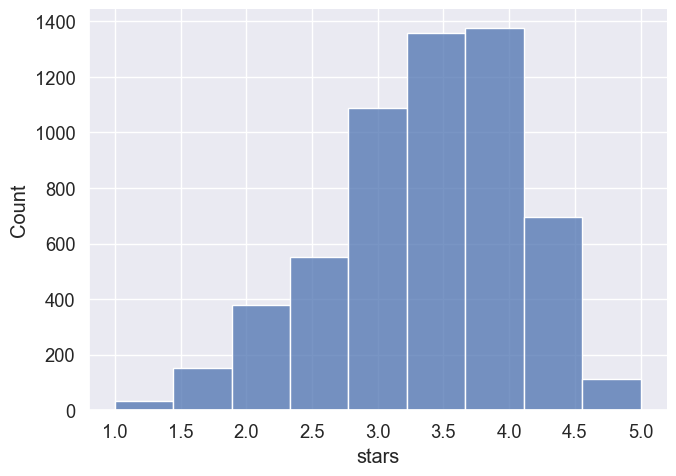

In [8]:
sns.displot(
  data=df_yelp_business,
  x='stars',
  kind='hist',
  aspect=1.4,
  bins=9
)

### Most Popular Business Categories

In [9]:
categories_map = dict()

for categories in df_yelp_business['categories']:
    for category in categories.split(', '):
        if category in categories_map:
            categories_map[category] += 1
        else:
            categories_map[category] = 1

top_categories = sorted(categories_map.items(), key=lambda x: categories_map[x[0]], reverse=True)

print(f'Total number of categories is {len(top_categories)}\n')
print(f'{"Category name": <30} {"Number of business": <20}')
for category in top_categories:
    print(f'{category[0]: <30} {category[1]: <20}')

Total number of categories is 411

Category name                  Number of business  
Restaurants                    5748                
Food                           1492                
Nightlife                      855                 
Bars                           825                 
Fast Food                      754                 
Sandwiches                     723                 
Pizza                          685                 
American (Traditional)         675                 
Breakfast & Brunch             595                 
Burgers                        554                 
Italian                        484                 
Mexican                        473                 
American (New)                 471                 
Chinese                        446                 
Coffee & Tea                   390                 
Cafes                          323                 
Japanese                       276                 
Chicken Wings                

### Hours Distribution
Let's summarize the distribution of opening hours for each day of week.

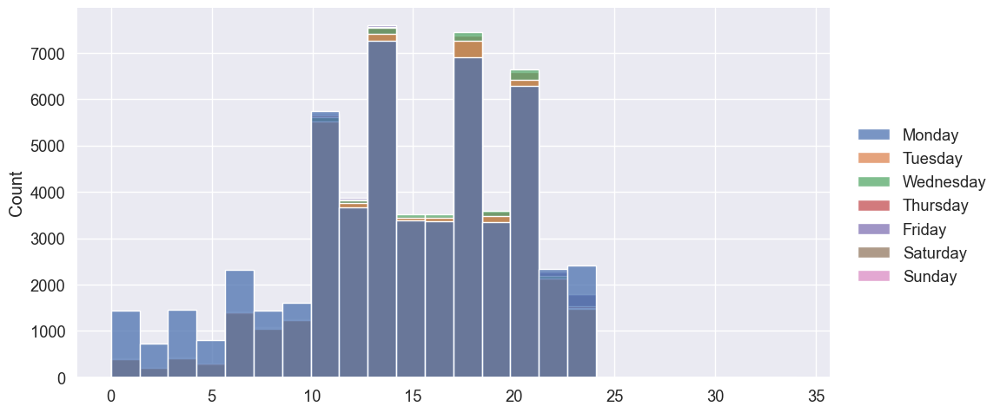

In [10]:
hours_map = dict()

for hours in df_yelp_business['hours']:
    if hours == hours:  # filter NaNs
        hours_prepared = hours.replace("'", "\"")
        hours_dict = json.loads(hours_prepared)
        
        for day_hours in hours_dict.items():
            start_hour = int(day_hours[1].split('-')[0].split(':')[0])
            end_hour = int(day_hours[1].split('-')[1].split(':')[0])
            if end_hour == 0:
                end_hour = 24
            if end_hour - start_hour < 0:
                end_hour += 12
            if day_hours[0] in hours_map:
                hours_map[day_hours[0]] += list(range(start_hour, end_hour + 1))
            else:
                hours_map[day_hours[0]] = list(range(start_hour, end_hour + 1))
        
sns.displot(
  data=hours_map,
  kind='hist',
  aspect=2,
  bins=24,
)

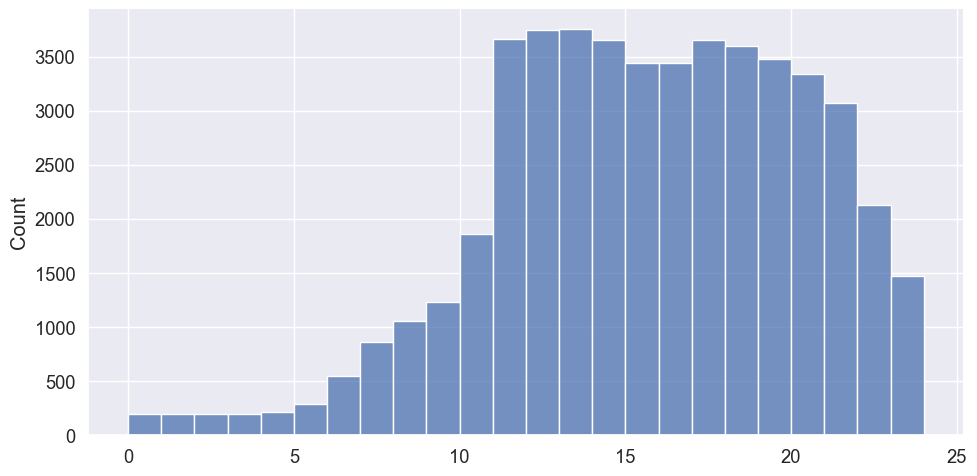

In [11]:
sns.displot(
  data=hours_map['Tuesday'],
  kind='hist',
  aspect=2,
  bins=24,
)

## Building recommender

First of all you should process user reviews to get the utility matrix containing ratings for users and businesses. There will be a lot of 0 in this matrix and it is better to store such matrices in the specialized data structure for sparse matrices. However, your working dataset is relatively small and we can use simple **pd.DataFrame** to proceed

In [12]:
def find_and_print_values(df):
    print('start of print')
    i = 10
    for col in df:
        print(list(df[col].dropna()))
        i -= 1
        if i == 0:
            break


def create_utility_matrix(reviews: pd.DataFrame, business: pd.DataFrame) -> pd.DataFrame:
    business_ids = business["business_id"].unique()
    users = reviews["user_id"].unique()
    ut_matrix = pd.DataFrame(None, columns=business_ids, index=users)
    for _, review in reviews.iterrows():
        ut_matrix.loc[review["user_id"], review["business_id"]] = review["stars"]
        
    find_and_print_values(ut_matrix)
    
    return ut_matrix


def normalize_matrix(ut_matrix: pd.DataFrame) -> pd.DataFrame:
    # Perform rating normalization
    
    # Step 1. Normalize rows by subtracting an average user review for all businesses
    # filter zeros to not count in the mean
    ut_matrix = ut_matrix.sub(ut_matrix.mean(axis=1), axis=0)
    find_and_print_values(ut_matrix)
    # Step 2. Normalize columns by subtracting an average review for this business
    ut_matrix = ut_matrix.sub(ut_matrix.mean(axis=0), axis=1)
    find_and_print_values(ut_matrix)
    # Normalize to (-1, 1) range
    # Current values are in (-4, 4) range because of double subtraction
    # That is why we can divide all values by 4
    ut_matrix /= 4
    find_and_print_values(ut_matrix)
    
    return ut_matrix


df_utility_matrix_orig = create_utility_matrix(df_yelp_reviews, df_yelp_business)

df_utility_matrix = normalize_matrix(df_utility_matrix_orig)
df_utility_matrix.head(20)

start of print
[]
[3, 3, 3]
[3, 4]
[4, 5, 5, 5]
[5, 4, 5, 4, 4, 3, 1]
[5, 5, 3, 5]
[4, 1, 4, 4]
[3, 3, 4, 1]
[4, 5]
[2, 3, 3, 5]
start of print
[]
[-0.34782608695652195, -0.9090909090909092, 0.0]
[-0.08333333333333348, 0.75]
[1.0441176470588234, 1.1851851851851851, 1.1818181818181817, 0.2857142857142856]
[0.75, 0.3333333333333335, 0.33333333333333304, 0.25, 0.25, -0.25, -1.6666666666666665]
[0.5999999999999996, 0.8888888888888893, -0.1904761904761907, 0.0]
[0.07142857142857162, -1.75, -0.666666666666667, 0.25]
[-1.0, -0.5434782608695654, -0.1875, -2.3333333333333335]
[0.0, 1.5]
[-1.3846153846153846, -0.8529411764705883, 0.75, 0.666666666666667]
start of print
[]
[0.0711462450592884, -0.4901185770750988, 0.41897233201581036]
[-0.41666666666666674, 0.41666666666666674]
[0.11990882211470444, 0.2609763602410662, 0.2576093568740627, -0.6384945392298333]
[0.75, 0.3333333333333335, 0.33333333333333304, 0.25, 0.25, -0.25, -1.6666666666666665]
[0.2753968253968251, 0.5642857142857147, -0.5150793

,pQeaRpvuhoEqudo3uymHIQ,CsLQLiRoafpJPJSkNX2h5Q,lu7vtrp_bE9PnxWfA8g4Pg,vjTVxnsQEZ34XjYNS-XUpA,fnZrZlqW1Z8iWgTVDfv_MA,rVBPQdeayMYht4Uv_FOLHg,fhNf_sg-XzZ3e7HEVGuOZg,LoRef3ChgZKbxUio-sHgQg,Ga2Bt7xfqoggTypWD5VpoQ,xFc50drSPxXkcLvX5ygqrg,tLpkSwdtqqoXwU0JAGnApw,Sd75ucXKoZUM2BEfBHFUOg,lK-wuiq8b1TuU7bfbQZgsg,LAoSegVNU4wx4GTA8reB6A,-qjn24n8HYF6It9GQrQntw,ZkzutF0P_u0C0yTulwaHkA,0QjROMVW9ACKjhSEfHqNCQ,RrapAhd8ZxCj-iue7fu9FA,7j0kor_fkeYhyEpXh4OpnQ,OWkS1FXNJbozn-qPg3LWxg,j9bWpCRwpDVfwVT_V85qeA,6GHwgKNlvfIMUpFaxgBjUA,Ir_QIzs-4o9ElOtiGuxJrw,0Y5Kzo8PWHTjk0tlfAKcDQ,JcsZvx-4yovFgCXOfd6KMg,...,gVLzkqIAHIWro_ZxkpjbFg,GCen6oV-_6PfMP_uKN-dZw,P3dBcZh_Hmr1wVWFZn2b-g,2Wzet4CPV0glZYXqFGyqyg,XjrjVQfKpbcvOXda-5r1jQ,u1jADJ_yMcL8bRJre7hjMQ,VBCR0KKjFfzfcvV36KnkhA,02hhtAO83rZBU1hflleElA,6pKR-h3KN7AwgGOOYBbE2A,E50mr3xobsahb77IBRwVTQ,W1iwBUfcDxoOPfhwr6EOGQ,kw3DbQo6Pqo83FSDx8HQjQ,aGMU3qMFOQzG0DT2akMfng,1SJiW_mW6IlEe7hqMTnjYg,LkMtMHVetws5_7QfRjPtlg,2SfSzEd3B7WimeZac23zhg,1dV3qNEv8nNUAX1k3qdE2w,YHCseOJ93wJh0gBcii_2qA,TJt1W9haRm2DKuoZLQ69yA,wM8QNs7uSyDqMJKjBYFPCQ,gp_bu7Ah81qaBY3M0Leffw,PUKOr5bEI87TVHjwijT1xw,zV38gkkEeJ4cVRlSWWQTfQ,H1j34TgbrVZkxeww9xlJTw,F8M0IukXQqR50IRyocRQbg
UgMW8bLE0QMJDCkQ1Ax5Mg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
aq_ZxGHiri48TUXJlpRkCQ,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
jOERvhmK6_lo_XGUBPws_w,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2hRe26HSCAWbFRn5WChK-Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
A0j21z2Q1HGic7jW6e9h7A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
XivuRnPq3D-K5cPiBTztIA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
H3wPBzQCKCKiHcV7GZK4kg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.361406,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6UR0kNe3C-ivlF2x1fPHNQ,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
FmQxARdHGnkclvcVWGEAxw,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
fVILhIglx6RNOXQba5t4kQ,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
df_utility_matrix.fillna(0).values.max()

0.8824404761904762

In [14]:
df_utility_matrix.fillna(0).values.min()

-0.9244434517310335

In [15]:
sdf = df_utility_matrix.astype(pd.SparseDtype("float", np.nan))
sdf.sparse.density

0.000815981305829107

In [16]:
'dense : {:0.2f} bytes'.format(df_utility_matrix.memory_usage().sum() / 1e3)

'dense : 742046.40 bytes'

In [17]:
'sparse: {:0.2f} bytes'.format(sdf.memory_usage().sum() / 1e3)

'sparse: 1691.60 bytes'

## Content-Based Recommender

### Build Business Profile

To build a business profile, we need to understand which features are we going to include in the embedding of each business.

Here is the list of available features in our dataset: address, attributes, business_id, categories, city, hours, is_open, latitude, longitude, name, postal_code, review_count, stars, state.

At first, let's filter location features as we do not need that many of them. Business coordinates (latitude and longitude) are the msot relevant location feature since they are numeric and can be comparable with each other really well. The other features such as city, address, state, postal_code are derived from coordinates and they are less significant, so we can ignore them.

We can also filter out business name, since we already business categories and the name does not add anything valuable.

Attributes is to difficult to evaluate, so we will skip that too.

**Final list of features: business_id, coordinates, categories, hours, is_open, review_count, stars**

In [18]:
def get_norm_vec(vec):
    vec = np.array(vec)
    if np.sum(vec) != 0:
        vec = vec / np.sqrt(np.sum(vec**2))
    return vec


def get_working_times(business):
    # input business dictionary with hours key
    # returns (int, int, int) standing for open night_hours, noon_hours, and evening_hours
    night_hours = set(range(0, 10))
    noon_hours = set(range(11, 21))
    evening_hours = set(range(21, 25))
    
    result = [0, 0, 0]
    
    working_hours = business['hours']
                
    if working_hours == working_hours:  # discard NaN values
        working_hours = json.loads(working_hours.replace("'", "\""))

        for day_hours in working_hours.items():
            start_hour = int(day_hours[1].split('-')[0].split(':')[0])
            end_hour = int(day_hours[1].split('-')[1].split(':')[0])
            if end_hour == 0:
                end_hour = 24
            if end_hour - start_hour < 0:
                end_hour += 12

            hours_range = list(range(start_hour, end_hour + 1))

            if not night_hours.isdisjoint(hours_range):
                result[0] += 1
            if not noon_hours.isdisjoint(hours_range):
                result[1] += 1
            if not evening_hours.isdisjoint(hours_range):
                result[2] += 1
                
    # normalize result
    result = get_norm_vec(result)
    
    return list(result)


def get_description(business):
    # description will be formed by attributes and categories. We will do TF-IDF for this info later.
    transformed_attributes = ''
    categories = ''
    if business['attributes'] == business['attributes']:  # filter NaNs
        # at first, let's filter attributes and join key-value pairs to form unique features.
        transformed_attributes = business['attributes'] \
            .replace("': \"{'", '').replace("}\", '", '').replace('\': "', '').replace('\': \'', '') \
            .replace('"', '').replace("'", '').replace(": ", '').replace("{", '').replace("}", '') \
    
    if business['categories'] == business['categories']:  # filter NaNs
        # let's also add categories to that
        categories = business['categories']
        
    description = transformed_attributes  # categories + ", " + 
    
    # filter spaces from category name
    description = description.replace(", ", ',,,,').replace(" ", '').replace(",,,,", ', ')
    
    print(description)
    
    return description

In [19]:
def build_business_profiles(business: pd.DataFrame) -> pd.DataFrame:
    cols = ["business_id", "latitude", "longitude", "hours", "attributes", "categories", "is_open", "review_count", "stars"]
    new_df = business.filter(cols, axis=1).drop_duplicates(subset=["business_id"])
    new_df.set_index("business_id", inplace=True)

    new_df['night_hours'], new_df['noon_hours'], new_df['evening_hours'] = zip(*new_df.apply(lambda business : get_working_times(business), axis=1))
    del new_df['hours']
    
    new_df['description'] = new_df.apply(lambda business : get_description(business), axis=1)
    del new_df['attributes']
    
    return new_df

df_business_profiles = build_business_profiles(df_yelp_business)

RestaurantsAttireucasual, RestaurantsTakeOutTrue, BusinessAcceptsCreditCardsTrue, NoiseLeveluquiet, GoodForKidsFalse, RestaurantsReservationsFalse, RestaurantsGoodForGroupsFalse, BusinessParkingNone, RestaurantsPriceRange21, HasTVTrue, Alcoholnone, BikeParkingFalse, RestaurantsDeliveryTrue, ByAppointmentOnlyFalse, OutdoorSeatingFalse
RestaurantsGoodForGroupsTrue, OutdoorSeatingFalse, BusinessAcceptsCreditCardsTrue, RestaurantsTakeOutTrue, GoodForKidsTrue, BusinessParkinggarageFalse, streetFalse, validatedFalse, lotFalse, valetFalseRestaurantsPriceRange21, RestaurantsReservationsFalse, RestaurantsAttireucasual
GoodForKidsTrue, RestaurantsTakeOutTrue, Alcoholunone, RestaurantsReservationsFalse, RestaurantsGoodForGroupsFalse, RestaurantsDeliveryTrue
GoodForKidsTrue, RestaurantsTakeOutTrue, RestaurantsPriceRange21, BusinessAcceptsCreditCardsTrue, OutdoorSeatingFalse, BikeParkingTrue, RestaurantsAttireucasual, RestaurantsReservationsFalse, AmbienceromanticFalse, intimateFalse, touristyFalse

BusinessParkinggarageFalse, streetFalse, validatedFalse, lotTrue, valetFalseRestaurantsTakeOutTrue, RestaurantsGoodForGroupsTrue, BikeParkingTrue, OutdoorSeatingTrue, WiFifree, RestaurantsPriceRange22, GoodForKidsTrue, RestaurantsAttireucasual, HasTVTrue, Alcoholufull_bar, AmbiencetouristyFalse, hipsterFalse, romanticFalse, intimateFalse, trendyFalse, upscaleFalse, classyFalse, casualTrueRestaurantsDeliveryTrue, RestaurantsReservationsTrue, CatersFalse, NoiseLeveluaverage, GoodForMealdessertFalse, latenightFalse, lunchTrue, dinnerTrue, brunchFalse, breakfastFalse
BikeParkingFalse, HasTVTrue, RestaurantsGoodForGroupsTrue, RestaurantsAttireucasual, AmbiencetouristyFalse, hipsterFalse, romanticFalse, diveyFalse, intimateFalse, trendyFalse, upscaleFalse, classyFalse, casualFalseBusinessAcceptsCreditCardsTrue, CatersFalse, Alcoholnone, RestaurantsPriceRange22, DriveThruFalse, WiFifree, GoodForKidsTrue, RestaurantsDeliveryFalse, RestaurantsReservationsNone, BusinessParkinggarageFalse, street

RestaurantsDeliveryTrue, BusinessAcceptsCreditCardsTrue, BusinessParkinggarageFalse, streetFalse, validatedFalse, lotFalse, valetFalseRestaurantsPriceRange21
GoodForKidsTrue, BusinessAcceptsCreditCardsTrue, RestaurantsDeliveryTrue, RestaurantsReservationsFalse
RestaurantsGoodForGroupsTrue, CatersFalse, RestaurantsReservationsTrue, BikeParkingFalse, AmbienceromanticFalse, intimateFalse, classyFalse, hipsterFalse, diveyFalse, touristyFalse, trendyFalse, upscaleFalse, casualTrueBusinessParkinggarageFalse, streetFalse, validatedFalse, lotFalse, valetFalseHasTVTrue, RestaurantsAttireucasual, WiFino, RestaurantsPriceRange21, Alcoholufull_bar, GoodForKidsTrue, NoiseLeveluloud, RestaurantsDeliveryFalse, OutdoorSeatingFalse, RestaurantsTakeOutTrue
RestaurantsGoodForGroupsTrue, WiFifree, GoodForKidsFalse, BikeParkingTrue, RestaurantsTakeOutTrue, BusinessParkinggarageFalse, streetTrue, validatedFalse, lotFalse, valetFalseAlcoholbeer_and_wine, BusinessAcceptsCreditCardsTrue, RestaurantsAttirecasua

CatersFalse, RestaurantsReservationsFalse, RestaurantsTableServiceFalse, NoiseLevelquiet, GoodForMealdessertTrue, latenightFalse, lunchTrue, dinnerFalse, brunchFalse, breakfastFalseBikeParkingTrue, Alcoholunone, WiFifree, GoodForKidsTrue, HasTVFalse, RestaurantsTakeOutTrue, RestaurantsDeliveryTrue, AmbienceromanticFalse, intimateFalse, classyFalse, hipsterFalse, diveyFalse, touristyFalse, trendyFalse, upscaleFalse, casualTrueDogsAllowedTrue, BusinessAcceptsCreditCardsTrue, RestaurantsAttirecasual, OutdoorSeatingTrue, DriveThruFalse, RestaurantsPriceRange22, RestaurantsGoodForGroupsTrue, BusinessParkinggarageFalse, streetFalse, validatedFalse, lotFalse, valetFalse
RestaurantsDeliveryFalse, NoiseLeveluaverage, RestaurantsPriceRange21, OutdoorSeatingFalse, BusinessParkinggarageFalse, streetFalse, validatedFalse, lotTrue, valetFalseRestaurantsGoodForGroupsTrue, BikeParkingTrue, RestaurantsTakeOutTrue, GoodForKidsTrue, WiFiupaid, RestaurantsAttirecasual, GoodForMealdessertFalse, latenightFa

GoodForKidsTrue, RestaurantsGoodForGroupsTrue, RestaurantsDeliveryFalse, NoiseLeveluaverage, RestaurantsReservationsTrue, RestaurantsPriceRange22, RestaurantsTakeOutTrue, OutdoorSeatingFalse, BusinessParkinggarageFalse, streetFalse, validatedFalse, lotFalse, valetFalseRestaurantsAttireucasual, HasTVTrue
HasTVTrue, Smokinguoutdoor, MusicdjFalse, background_musicFalse, no_musicFalse, jukeboxFalse, liveFalse, videoFalse, karaokeFalseDogsAllowedFalse, BusinessParkinggarageFalse, streetFalse, validatedFalse, lotFalse, valetFalseBestNightsmondayFalse, tuesdayFalse, fridayFalse, wednesdayTrue, thursdayFalse, sundayFalse, saturdayTrueRestaurantsGoodForGroupsTrue, CoatCheckFalse, WheelchairAccessibleTrue, BikeParkingFalse, WiFiufree, RestaurantsReservationsTrue, OutdoorSeatingTrue, GoodForDancingFalse, RestaurantsPriceRange22, HappyHourTrue, NoiseLeveluloud, AmbiencetouristyFalse, hipsterFalse, romanticFalse, intimateFalse, trendyFalse, upscaleFalse, classyFalse, casualTrueAlcoholufull_bar
Alco

GoodForKidsFalse, NoiseLeveluquiet, RestaurantsPriceRange21, RestaurantsAttirecasual, RestaurantsGoodForGroupsTrue, RestaurantsTakeOutTrue, RestaurantsReservationsFalse, HasTVFalse, BusinessParkinggarageFalse, streetTrue, validatedFalse, lotFalse, valetFalseWiFiufree, GoodForMealdessertFalse, latenightFalse, lunchFalse, dinnerFalse, brunchFalse, breakfastFalseRestaurantsDeliveryFalse, OutdoorSeatingTrue, Alcoholunone, AmbiencetouristyFalse, hipsterFalse, romanticFalse, diveyFalse, intimateFalse, trendyFalse, upscaleFalse, classyFalse, casualFalseBusinessAcceptsCreditCardsTrue
BusinessParkinggarageFalse, streetFalse, validatedFalse, lotFalse, valetFalseOutdoorSeatingFalse, RestaurantsTakeOutTrue, RestaurantsPriceRange22, GoodForKidsTrue, RestaurantsAttireucasual, RestaurantsDeliveryTrue, Alcoholunone, AmbiencetouristyFalse, hipsterFalse, romanticFalse, intimateFalse, trendyFalse, upscaleFalse, classyFalse, casualFalseWiFino, GoodForMealdessertFalse, latenightFalse, lunchFalse, dinnerFal

GoodForMealdessertFalse, latenightFalse, lunchFalse, dinnerFalse, brunchFalse, breakfastFalseRestaurantsDeliveryTrue, RestaurantsPriceRange21, AmbiencetouristyFalse, hipsterFalse, romanticFalse, diveyFalse, intimateFalse, trendyFalse, upscaleFalse, classyFalse, casualFalse
CatersTrue, WiFiufree, HasTVTrue, GoodForKidsTrue, RestaurantsDeliveryTrue, RestaurantsPriceRange22, BikeParkingTrue, BusinessParkinggarageFalse, streetFalse, validatedFalse, lotTrue, valetFalseAlcoholufull_bar, RestaurantsGoodForGroupsTrue, BusinessAcceptsCreditCardsTrue, RestaurantsReservationsTrue, OutdoorSeatingTrue, RestaurantsAttireucasual, BusinessAcceptsBitcoinFalse, GoodForMealdessertFalse, latenightFalse, lunchTrue, dinnerFalse, brunchTrue, breakfastTrueRestaurantsTakeOutTrue, RestaurantsTableServiceTrue, AmbienceromanticFalse, intimateFalse, touristyFalse, hipsterFalse, diveyFalse, classyFalse, trendyFalse, upscaleFalse, casualTrueDogsAllowedTrue, NoiseLeveluaverage, HappyHourTrue, WheelchairAccessibleTrue

RestaurantsGoodForGroupsTrue, Alcoholunone, RestaurantsTakeOutTrue, RestaurantsPriceRange21, CatersFalse, GoodForKidsTrue, RestaurantsAttireucasual, OutdoorSeatingFalse, RestaurantsDeliveryFalse, RestaurantsReservationsFalse, WiFino, BusinessAcceptsCreditCardsTrue, NoiseLeveluaverage, AmbienceromanticFalse, intimateFalse, classyFalse, hipsterFalse, diveyFalse, touristyFalse, trendyFalse, upscaleFalse, casualFalseGoodForMealdessertFalse, latenightFalse, lunchFalse, dinnerFalse, brunchFalse, breakfastFalseBusinessParkinggarageFalse, streetFalse, validatedFalse, lotTrue, valetFalseHasTVTrue
RestaurantsGoodForGroupsTrue, CatersTrue, Alcoholbeer_and_wine, RestaurantsTakeOutTrue, RestaurantsReservationsTrue, RestaurantsDeliveryTrue, NoiseLeveluaverage, GoodForKidsTrue, GoodForMealdessertFalse, latenightFalse, lunchTrue, dinnerTrue, brunchFalse, breakfastFalseRestaurantsPriceRange22, RestaurantsAttireucasual, BusinessParkinggarageFalse, streetFalse, validatedFalse, lotTrue, valetFalseOutdoorS

RestaurantsReservationsFalse, BusinessAcceptsCreditCardsTrue, CatersFalse, RestaurantsPriceRange21, RestaurantsGoodForGroupsTrue, GoodForKidsTrue, RestaurantsTakeOutTrue, BikeParkingTrue, BusinessParkinggarageFalse, streetFalse, validatedFalse, lotFalse, valetFalseAmbienceromanticFalse, intimateFalse, classyFalse, hipsterFalse, diveyFalse, touristyFalse, trendyFalse, upscaleFalse, casualFalseOutdoorSeatingFalse, Alcoholunone, NoiseLeveluaverage, WiFiuno, RestaurantsTableServiceFalse, DriveThruFalse, GoodForMealdessertFalse, latenightTrue, lunchTrue, dinnerTrue, brunchFalse, breakfastFalseRestaurantsAttirecasual, RestaurantsDeliveryTrue, HasTVTrue
GoodForMealdessertFalse, latenightFalse, lunchFalse, dinnerFalse, brunchFalse, breakfastFalseAmbiencetouristyFalse, hipsterFalse, romanticFalse, diveyFalse, intimateFalse, trendyFalse, upscaleFalse, classyFalse, casualFalseGoodForKidsTrue, HasTVFalse, RestaurantsGoodForGroupsFalse, RestaurantsAttirecasual, RestaurantsReservationsFalse, Restaur

In [20]:
my_dict = dict()

for _, row in df_business_profiles.iterrows():
    desc = row.description
    for word in desc.split(', '):
        if word in my_dict:
            my_dict[word] += 1
        else:
            my_dict[word] = 1

top_items = sorted(my_dict.items(), key=lambda x: my_dict[x[0]], reverse=True)

print(f'Total number of categories is {len(top_items)}\n')
print(f'{"Category name": <30} {"Number of business": <20}')
for item in top_items[:100]:
    print(f'{item[0]: <30} {item[1]: <20}')

Total number of categories is 916

Category name                  Number of business  
validatedFalse                 4710                
upscaleFalse                   4368                
intimateFalse                  4349                
hipsterFalse                   4244                
RestaurantsTakeOutTrue         4212                
trendyFalse                    4117                
BusinessParkinggarageFalse     4082                
classyFalse                    3856                
RestaurantsGoodForGroupsTrue   3721                
streetFalse                    3694                
GoodForKidsTrue                3562                
diveyFalse                     3419                
BusinessAcceptsCreditCardsTrue 2950                
latenightFalse                 2800                
HasTVTrue                      2759                
RestaurantsDeliveryFalse       2709                
brunchFalse                    2621                
lotFalse                     

In [21]:
selected_attributes = ['RestaurantsTakeOutTrue', 'RestaurantsGoodForGroupsTrue', 'GoodForKidsTrue', 
                       'BusinessAcceptsCreditCardsTrue', 'BikeParkingTrue', 'OutdoorSeatingTrue', 
                       'RestaurantsReservationsTrue', 'lunchTrue', 'WiFiufree', 'lunchTrue']
selected_categories = ['Food', 'Nightlife', 'Bars', 'FastFood', 'Sandwiches', 'Pizza', 
                       'American(Traditional)', 'Breakfast&Brunch', 'Burgers', 'Coffee&Tea']

In [22]:
def get_selected_description(business):
    # description will be formed by attributes and categories. We will do TF-IDF for this info later.
    transformed_attributes = ''
    categories = ''
    if business['attributes'] == business['attributes']:  # filter NaNs
        # at first, let's filter attributes and join key-value pairs to form unique features.
        transformed_attributes = business['attributes'] \
            .replace("': \"{'", '').replace("}\", '", '').replace('\': "', '').replace('\': \'', '') \
            .replace('"', '').replace("'", '').replace(": ", '').replace("{", '').replace("}", '') \
    
    if business['categories'] == business['categories']:  # filter NaNs
        # let's also add categories to that
        categories = business['categories']
        
    description = categories + ", " + transformed_attributes
    
    # filter spaces from category name
    description = description.replace(", ", ',,,,').replace(" ", '').split(",,,,")
    
    # filter up to 20 features
    description = list(set(description) & set(selected_attributes + selected_categories))
    
    description = ', '.join(description)
    
    return description

In [23]:
from sklearn.feature_extraction.text import TfidfVectorizer
# list of text documents
all_values = df_yelp_business.apply(lambda business : get_selected_description(business), axis=1).values
# create the transform
vectorizer = TfidfVectorizer()
# tokenize and build vocab
vectorizer.fit(all_values)
# summarize
print('vectorizer.vocabulary_', len(vectorizer.vocabulary_), vectorizer.vocabulary_)
print('vectorizer.idf_', len(vectorizer.idf_), vectorizer.idf_)
# encode document
print(all_values[0])
vector = vectorizer.transform([all_values[0]])
# summarize encoded vector
print(vector.shape)
print(vector.toarray())

vectorizer.vocabulary_ 22 {'food': 9, 'restaurantstakeouttrue': 17, 'businessacceptscreditcardstrue': 6, 'goodforkidstrue': 10, 'restaurantsgoodforgroupstrue': 15, 'fastfood': 8, 'bikeparkingtrue': 2, 'burgers': 5, 'american': 0, 'traditional': 20, 'outdoorseatingtrue': 13, 'coffee': 7, 'tea': 19, 'pizza': 14, 'restaurantsreservationstrue': 16, 'lunchtrue': 11, 'wifiufree': 21, 'breakfast': 3, 'brunch': 4, 'sandwiches': 18, 'nightlife': 12, 'bars': 1}
vectorizer.idf_ 22 [3.14058813 2.94018643 1.86072323 3.26654054 3.26654054 3.33781309
 1.66688183 3.68807365 3.03006346 2.34823841 1.47842304 2.32375819
 2.90451083 2.1911259  3.12590358 1.43476477 2.2242974  1.31085094
 3.07198981 3.68807365 3.14058813 2.61449503]
Food, RestaurantsTakeOutTrue, BusinessAcceptsCreditCardsTrue
(1, 22)
[[0.         0.         0.         0.         0.         0.
  0.52682336 0.         0.         0.74216829 0.         0.
  0.         0.         0.         0.         0.         0.41429865
  0.         0.      

In [24]:
def build_business_profiles(business: pd.DataFrame) -> pd.DataFrame:
    cols = ["business_id", "state", "hours", "attributes", "categories", "is_open"]  # "review_count", "stars"
    new_df = business.filter(cols, axis=1).drop_duplicates(subset=["business_id"])
    new_df.set_index("business_id", inplace=True)

    new_df['night_hours'], new_df['noon_hours'], new_df['evening_hours'] = zip(*new_df.apply(lambda business : get_working_times(business), axis=1))
    del new_df['hours']
    
    desc_encoded = new_df.apply(lambda business : get_selected_description(business), axis=1)
    desc_encoded = vectorizer.transform(desc_encoded).todense()
    desc_encoded = np.squeeze(np.asarray(desc_encoded))

    prefix = 'desc_'
    for i in range(len(desc_encoded)):
        desc = list(desc_encoded[i])
        for j, val in enumerate(desc):
            new_df[f'{prefix}{j}'] = val

    del new_df['attributes']
    del new_df['categories']
    
    one_hot = pd.get_dummies(new_df['state'])
    new_df = new_df.drop('state', axis=1)
    new_df = new_df.join(one_hot)
    
    return new_df

df_business_profiles = build_business_profiles(df_yelp_business)


In [25]:
df_business_profiles

,is_open,night_hours,noon_hours,evening_hours,desc_0,desc_1,desc_2,desc_3,desc_4,desc_5,desc_6,desc_7,desc_8,desc_9,desc_10,desc_11,desc_12,desc_13,desc_14,desc_15,desc_16,desc_17,desc_18,desc_19,desc_20,desc_21,AB,AZ,CO,IL,NC,NV,OH,ON,PA,QC,SC,WI,XWY
business_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
pQeaRpvuhoEqudo3uymHIQ,1,0.0,1.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,1,0,0,0,0,0,0,0,0,0
CsLQLiRoafpJPJSkNX2h5Q,0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,1,0,0,0,0,0,0,0,0
lu7vtrp_bE9PnxWfA8g4Pg,1,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,1,0,0,0,0,0
vjTVxnsQEZ34XjYNS-XUpA,1,0.0,0.759257,0.650791,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0
fnZrZlqW1Z8iWgTVDfv_MA,0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
gp_bu7Ah81qaBY3M0Leffw,0,0.0,0.707107,0.707107,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,0,0,0,0,0,0,0
PUKOr5bEI87TVHjwijT1xw,1,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,1,0,0,0,0,0
zV38gkkEeJ4cVRlSWWQTfQ,0,0.0,0.707107,0.707107,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,1,0,0,0,0,0


In [26]:
DESC_LENGTH = 22
STATES = ["AB", "AZ", "CO", "IL", "NC", "NV", "OH", "ON", "PA", "QC", "SC", "WI", "XWY" ]
STATES_LENGTH = len(STATES)


def build_user_profiles(utility_matrix: pd.DataFrame, 
                                   business_profiles: pd.DataFrame) -> pd.DataFrame:
    # взяти всі айтем вектори, помножити на рейтинг і додати
    cols = ["is_open"]
    user_profiles = pd.DataFrame(0, index=utility_matrix.index, columns=cols)
    user_profiles.index.name = 'user_id'
    user_profiles.is_open = 1
    
    new_user_profile = list()
    
    # Each row in the utility matrix stands for a separate user. 
    # Based on user reviews, we need to find a vector of what user likes the most
    for user_id, user in user_profiles.iterrows():
        user_reviews = utility_matrix.loc[utility_matrix.index == user_id]
        user_reviews = user_reviews.dropna(axis=1)  # drop all NaNs
        
        total_desc = [0] * DESC_LENGTH
        total_hours = [0, 0, 0]  # will be True if business works in night hours (0-9), 
        # noon hours (10-20), evening hours (21-24)
        total_states = [0] * STATES_LENGTH  # contains mapping coordinate -> number 
        # where a number stands for the number of other highly rated business in 5km radius from the given coordinate 
        
        for business_id, rating in user_reviews.items(): 
            rating = rating[0]
            business = business_profiles.loc[business_profiles.index == business_id]
            business_info = dict()
            for label, value in business.items(): business_info[label] = value[0]
                
            # add hours
            total_hours[0] += business_info['night_hours']
            total_hours[1] += business_info['noon_hours']
            total_hours[2] += business_info['evening_hours']

            # add states
            for idx in range(STATES_LENGTH):
                total_states[idx] += business_info[STATES[idx]]
                
            prefix = 'desc_'
            
            for idx in range(DESC_LENGTH):
                if rating > 0.2:  # user likes this business, add categories
                    total_desc[idx] += business_info[f'{prefix}{idx}']
                elif rating < -0.2:  # user dislikes this business, remove categories
                    total_desc[idx] -= business_info[f'{prefix}{idx}']
                    
        # normalize result
        total_desc = get_norm_vec(total_desc)
        total_hours = get_norm_vec(total_hours)
        total_states = get_norm_vec(total_states)
    
#         print(total_desc)
#         print(total_hours)
#         print(total_states)
        
        # save states
        for idx in range(STATES_LENGTH):
            user[STATES[idx]] = total_states[idx]
            
        # save hours
        user['night_hours'] = total_hours[0]
        user['noon_hours'] = total_hours[1]
        user['evening_hours'] = total_hours[2]
        
        # save desc
        for idx in range(DESC_LENGTH):
            user[f'{prefix}{idx}'] = total_desc[idx]
       
        new_user_profile.append(user)
        print(user.values)
#         user_profiles[user_id] = user
    
    return pd.DataFrame(new_user_profile)

df_user_profiles = build_user_profiles(df_utility_matrix, df_business_profiles)

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.19486556 0.82388368 0.53220588 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.13315637 0.70081002 0.70081002 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.28022035  0.81009419  0.51499898  0.
  0.          0.          0

[ 1.          0.          0.          0.          0.          0.99388373
  0.          0.11043153  0.          0.          0.          0.
  0.          0.          0.01395346  0.86287686  0.50522157  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.40162619  0.647571    0.647571    0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.    

[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.09921268  0.82276309  0.55965859  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.
  0.          0.          0.0388824   0.81146365  0.58310797  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0. 

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.16556009 0.84664549 0.50574823 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.38151304  0.79056722  0.47901071  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.03601443 0.7244258  0.68841137 0.
 0.   

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.         0.92387953 0.38268343 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.14816693 0.89093666 0.42927664 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.274202   0.79520724 0.54079451 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.24817896 0.7701994  0.5875373  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.37742985 0.7510919  0.54167118 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.13157622  0.83694891  0.53122897  0.
  0.          0.          0

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.49480128 0.83113644 0.25373984 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.28219758 0.78124226 0.55679894 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.32713878 0.68218407 0.65391522 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.06968793 0.7600068  0.64616813 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.39720829 0.79643801 0.45597376 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.13416508 0.70986018 0.69144649 0.
 0.         0.         0.         0.         

[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.13930856  0.74366117  0.65388164  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.9912279  0.         0.         0.
 0.13216372 0.         0.         0.         0.         0.
 0.         0.         0.25263408 0.85216078 0.45825542 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.34022455 0.79816255 0.49717583 0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.21771529 0.69014493 0.69014493 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.98994949 0.         0.         0.
 0.14142136 0.         0.         0.         0.         0.
 0.         0.         0.2880906  0.76143246 0.58071027 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.26597513 0.81754133 0.51076747 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.27300949 0.73767126 0.61750055 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.21275505 0.79457247 0.56867379 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.15861562 0.82187327 0.54714296 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.32038448 0.79404019 0.5165791  0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.
  0.          0.          0.19465239  0.82478535  0.53088565  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.68786034 0.68786034 0.23172462 0.
 0.   

[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.10623679  0.77910396  0.61782745  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.
  0.          0.          0.02516923  0.72273312  0.69066877  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.1

[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.
  0.          0.          0.19720921  0.93789827  0.28540385  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.30251737 0.7932699  0.52839956 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.86285621 0.50544947 0.
 0.   

[1.         0.         0.         0.         0.         0.
 0.         0.05255883 0.         0.99861783 0.         0.
 0.         0.         0.06963441 0.78056871 0.62117915 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.42709892 0.79697743 0.42709892 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.21693046 0.         0.97618706 0.
 0.         0.         0.28960256 0.72956201 0.61957214 0.
 0.         0.         0.         0.         

[1.         0.         0.31622777 0.         0.         0.
 0.9486833  0.         0.         0.         0.         0.
 0.         0.         0.30290545 0.67388734 0.67388734 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.16712079  0.83839693  0.5188075   0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.60058057 0.76662914 0.22711835 0.
 0.   

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.02255508 0.83306609 0.55271346 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.02810037  0.88139982  0.47153444  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.         0.         0.02665665 0.82691906 0.56168878 0.
 0.   

[ 1.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.
  0.  0.  0.  0.  0. -1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.2008131  0.69270271 0.69270271 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.03601443 0.7244258  0.68841137 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.84515425 0.         0.         0.
 0.

[1.         0.02698763 0.99854227 0.         0.         0.02698763
 0.02698763 0.02698763 0.         0.         0.         0.
 0.         0.         0.16920401 0.79605286 0.58109366 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.10137248 0.75166591 0.65170697 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.10468478  0.99450545  0.          0.          0.
  0.          0.          0.12549653  0.78764735  0.60320997  0.
  0.          0.   

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.76176552 0.64785283 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.17378163 0.80441347 0.56808355 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.4472136  0.         0.         0.         0.         0.
 0.89442719 0.         0.40824829 0.81649658 0.40824829 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.14038911 0.73490184 0.66348337 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.34041656 0.80344913 0.48845272 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.84341065 0.53726946 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.5547002
 0.         0.         0.         0.         0.         0.83205029
 0.         0.         0.02343401 0.7069126  0.7069126  0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.44758137 0.66032936 0.60302243 0.
 0.         0.         0.     

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.07108473 0.86158011 0.50261981 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.52287828 0.74202757 0.41951566 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.07020863 0.83863707 0.54014684 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.29847788 0.67487442 0.67487442 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         1.         0.
 0.         0.         0.63641002 0.63641002 0.43584926 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.89442719 0.         0.         0.
 0.4472136  0.         0.         0.         0.         0.
 0.         0.         0.06957523 0.72316911 0.68715772 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.27442634 0.69225787 0.66743481 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.24240162  0.82019909  0.51818424  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.50492573  0.71083758  0.4

[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.08062353  0.77978161  0.62083854  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.316402    0.89430395  0.316402    0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.0

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.85059533 0.52582088 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.89044678 0.4550874  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.99846035 0.         0.05547002 0.
 0.         0.         0.25131968 0.79678808 0.54951539 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.         0.96753822 0.25272473 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.26597513 0.81754133 0.51076747 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.11388092 0.74146254 0.66125974 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.30290545 0.67388734 0.67388734 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.50449965 0.78477746 0.36000616 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.18993571 0.77015286 0.60892447 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.
  0.          0.          0.02089568  0.85837201  0.51260206  0.
  0.          0.          0

[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.19790592  0.76646702  0.61103319  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.30151134  0.          0.          0.
  0.90453403  0.          0.          0.          0.30151134  0.
  0.          0.          0.30310999  0.81051277  0.50119196  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.7

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.16013925 0.74945797 0.64239254 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.18230048  0.85981051  0.47696166  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.19611614 0.         0.         0.         0.         0.
 0.98058068 0.         0.05938601 0.83076337 0.55344875 0.
 0.   

[1.         0.         0.99227788 0.         0.         0.
 0.         0.12403473 0.         0.         0.         0.
 0.         0.         0.17837953 0.80687871 0.56314073 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.15765462 0.81913439 0.55151053 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.26493286 0.83474857 0.48270633 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.02897285 0.75040956 0.66033784 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.70710678  0.70710678  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.99388373  0.          0.          0.
  0.11043153  0.          0.          0.          0.          0.
  0.          0.          0.26263076  0.75615613  0.5

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.36314133 0.77481667 0.51748188 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.46707001 0.76909814 0.43627245 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.1963378  0.72832775 0.65649841 0.
 0.         0.         0.         0.         

[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.10140055  0.73600225  0.66934193  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.12005657  0.70602387  0.69793747  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          

[1.         0.         0.         0.         0.19611614 0.
 0.         0.98058068 0.         0.         0.         0.
 0.         0.         0.26442476 0.82404422 0.50102962 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.316402   0.89430395 0.316402   0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.04344773 0.79539449 0.60453279 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.20094321 0.71130196 0.6735513  0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.26597513 0.81754133 0.51076747 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.06707804 0.70551419 0.70551419 0.
 0.         0.         0.         0.         

[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.
  0.          0.          0.46164222  0.78082983  0.4209409   0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.31695965 0.74518986 0.58671003 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.07244847 0.98051951 0.18257247 0.
 0.   

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.21513725 0.85125414 0.47862549 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         1.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.98994949 0.14142136 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.11263108 0.77073617 0.6271204  0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.14719729 0.82016478 0.5528677  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.24689019 0.7026502  0.66732895 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.30313109 0.69043307 0.65682092 0.
 0.         0.         0.         0.         

[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.8         0.          0.6         0.
  0.          0.          0.23821269  0.79642084  0.55584941  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.31622777 0.         0.         0.         0.
 0.         0.         0.9486833  0.         0.         0.
 0.         0.         0.         0.89044678 0.4550874  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.38008572 0.75145948 0.53929908 0.
 0.   

[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.0139252  0.78826467 0.61517875 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.05890708 0.77221526 0.63262433 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.89044678 0.4550874  0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.20141624 0.73198136 0.65087233 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.31622777 0.         0.         0.         0.
 0.         0.         0.9486833  0.         0.         0.
 0.         0.         0.06903066 0.81342423 0.57756021 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.9974587  0.         0.         0.
 0.07124705 0.         0.         0.         0.         0.
 0.         0.         0.21667916 0.84013097 0.49722239 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.16346838 0.80038643 0.57676655 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.4340892  0.65448714 0.61904212 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         1.         0.
 0.         0.         0.66017254 0.66017254 0.35825193 0.
 0.         0.         0.         0.         

[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.27709453  0.76771622  0.5777806   0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.06630227 0.70555085 0.70555085 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.45597376 0.79643801 0.39720829 0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.49361875 0.7904418  0.3626876  0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.89442719 0.         0.4472136  0.
 0.         0.         0.07692923 0.70501131 0.70501131 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.05403484 0.73257406 0.67853922 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.11427942 0.74079585 0.66193786 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.
  0.          0.          0.13390445  0.86514912  0.48330797  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.24960025 0.8271552  0.50350173 0.
 0.   

[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.01740922 0.87377669 0.48601565 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.0232603  0.76503992 0.64356264 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         1.         0.
 0.         0.         0.07052863 0.77172625 0.63203189 0.
 0.         0.         0.         0.         

[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.08678585  0.72570989  0.68250522  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.26430604 0.85314851 0.44975543 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.3111606  0.69716064 0.64586851 0.
 0.   

[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.17887747  0.80129673  0.57089965  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.9486833  0.         0.31622777 0.         0.
 0.         0.         0.33882411 0.77835672 0.52854426 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.         0.7281431  0.68542514 0.
 0.   

[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.14538218 0.83266654 0.5343505  0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.98058068 0.19611614 0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.12606127 0.7918123  0.59761345 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.10201985 0.81078607 0.57638347 0.
 0.         0.         0.         0.         

[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.05501826  0.86916349  0.49145479  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.20910953  0.74783904  0.63008727  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.05635976 0.75098711 0.65790724 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.09001576 0.81795665 0.5681937  0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.2574981  0.78581146 0.56231226 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.14996194 0.72865267 0.66826395 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.35805426 0.8010691  0.47967223 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.07608    0.81592952 0.57312376 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         1.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.2771154  0.83745399 0.47103915 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.19268861  0.77824049  0.59767285  0.
  0.          0.          0

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.35983668 0.88321923 0.30073469 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.08336347 0.86556787 0.4938044  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.26726124  0.80178373  0.53452248  0.
  0.          0.          0

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.02514983 0.70688312 0.70688312 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.         0.         0.31094354 0.8535399  0.41807147 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.98994949 0.         0.14142136 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.1463599  0.74458956 0.65127964 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.04444165 0.80530455 0.59119331 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.70710678 0.70710678 0.         0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.14627275 0.78447516 0.60266325 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.19537348 0.81601578 0.54401052 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.09833909 0.70367941 0.70367941 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.03105791 0.89945072 0.4359172  0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.         0.76822128 0.6401844  0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.73842256 0.67433829 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.03125473 0.93890931 0.34274255 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.14398502 0.77132625 0.61993881 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.22796016 0.79413915 0.56336239 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.11371391  0.84749476  0.51848026  0.
  0.          0.          0

[1.         0.         0.89442719 0.         0.         0.
 0.         0.         0.         0.4472136  0.         0.
 0.         0.         0.23279445 0.81998558 0.52290572 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.19224954 0.96254697 0.19116337 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.89442719 0.         0.         0.
 0.4472136  0.         0.         0.         0.         0.
 0.         0.         0.70710678 0.5        0.5        0.
 0.         0.         0.         0.         

[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.23438966  0.68740872  0.68740872  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.30251737 0.7932699  0.52839956 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.07522609 0.76448064 0.64024244 0.
 0.   

[ 1.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.03097386  0.81117292  0.58398555  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.20491446 0.76776807 0.60707681 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.98639392 0.         0.         0.
 0.16439899 0.         0.         0.         0.         0.
 0.         0.         0.34589022 0.75674813 0.55470012 0.
 0.   

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.36006658 0.73458603 0.57509601 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.10482848 0.         0.94345635 0.         0.31448545 0.
 0.         0.         0.06088734 0.82606227 0.56028016 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.9701425  0.         0.         0.
 0.24253563 0.         0.         0.         0.         0.
 0.         0.         0.18825438 0.74176019 0.64370188 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.17365909 0.88253236 0.43701162 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.14239264 0.91039595 0.38846306 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.16339942 0.71145968 0.68346599 0.
 0.         0.         0.         0.         

[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.89442719  0.          0.4472136   0.
  0.          0.          0.25084158  0.8440441   0.47399162  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.99705449 0.         0.         0.
 0.0766965  0.         0.         0.         0.         0.
 0.         0.         0.15486634 0.75596203 0.63603289 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.02569644 0.81455696 0.57951416 0.
 0.   

[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.04798794 0.7984933  0.60008799 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.85059533 0.52582088 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.3983594  0.85678858 0.32744941 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.2008131  0.69270271 0.69270271 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.03353902 0.70670897 0.70670897 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.          0.          0.03353902  0.70670897  0.70670897  0.
  0.          0.          0

 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         1.         0.
 0.         0.         0.26726124 0.80178373 0.53452248 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.28115754 0.75783208 0.58876224 0.
 0.       

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.02017516 0.74169606 0.67043263 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.15861562 0.82187327 0.54714296 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.13870121 0.99033427 0.         0.
 0.         0.         0.         0.         

[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.02683027  0.93896018  0.34297802  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.9701425  0.         0.         0.
 0.24253563 0.         0.         0.         0.         0.
 0.         0.         0.         0.71787515 0.69617187 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.79362272 0.60841021 0.
 0.   

[ 1.          0.          0.          0.          0.          0.8
  0.          0.          0.          0.          0.          0.6
  0.          0.          0.14860989  0.73131181  0.66565617  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.26917899 0.75426513 0.59885457 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.
  0.          0.          0.01677562  0.72646962  0

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.37526634 0.77498245 0.50850504 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.07522609 0.76448064 0.64024244 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.33384257 0.75804785 0.56027903 0.
 0.         0.         0.         0.         

[ 1.          0.          0.          0.          0.          0.
  0.          0.99846035  0.          0.05547002  0.          0.
  0.          0.          0.22981648  0.84948849  0.47492493  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.         0.         0.0687046  0.80519318 0.5890192  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.2555976  0.77510752 0.57782194 0.
 0.   

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.07004428 0.81700139 0.57236572 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.98058068 0.         0.         0.
 0.19611614 0.         0.         0.         0.         0.
 0.         0.         0.06075449 0.82731953 0.55843646 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.70710678 0.70710678 0.         0.
 0.         0.         0.         0.         

[1.         0.         0.9701425  0.         0.         0.
 0.24253563 0.         0.         0.         0.         0.
 0.         0.         0.02343401 0.7069126  0.7069126  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.05255883 0.         0.         0.         0.
 0.         0.         0.99861783 0.         0.         0.
 0.         0.         0.12239594 0.82872351 0.54611041 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.05031562  0.70621114  0.70621114  0.
  0.          0.          0

[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.          0.          0.0563146   0.78304187  0.61941432  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.17684656 0.78890405 0.58851991 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.40824829 0.81649658 0.40824829 0.
 0.   

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.253981   0.78499691 0.56504292 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.07044162 0.85911676 0.50690865 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.13221175 0.83577172 0.53292184 0.
 0.         0.         0.         0.         

[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.16602046  0.83750222  0.52060276  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.25174968  0.85688852  0.44984905  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.3

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.10424114 0.80519426 0.58377735 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.01607644  0.82473898  0.56528503  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.10950059  0.72395529  0.6

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.17402638 0.8582157  0.4828878  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.33655677 0.81251992 0.47596315 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.11255074 0.70261381 0.70261381 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.06322019 0.88612482 0.45911438 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.85059533  0.52582088  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.92387953 0.38268343 0.
 0.   

[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.30251737  0.7932699   0.52839956  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.05802888 0.76155498 0.64549722 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.09173753 0.81272146 0.57538514 0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.20653997 0.69186026 0.69186026 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.34077436  0.84412488  0.41391547  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.20805041  0.81298876  0.5

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.18972772 0.80236662 0.56587208 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.04838542 0.87087438 0.48911826 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.45690584 0.71805295 0.52501144 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.         0.7449047  0.66717088 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.99589321  0.          0.          0.09053575
  0.          0.          0.          0.          0.          0.
  0.          0.          0.38737499  0.80050828  0.45730417  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.37796447 0.         0.         0.
 0.         0.         0.37796447 0.75592895 0.37796447 0.
 0.         0.         0.15084392 0.78129886 0.60565518 0

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.02472575 0.90417023 0.42645614 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.24508114 0.70038842 0.67036654 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         1.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.04231935 0.87375343 0.48452453 0.
 0.         0.         0.         0.         

[ 1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.34288415  0.8837529   0.31845136  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.14316809 0.73671699 0.66087138 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.19939181 0.85389609 0.48073316 0.
 0.   

 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.91914503  0.          0.3939193   0.
  0.          0.          0.19351893  0.76484346  0.6144631   0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.29475708 0.74246069 0.60155663 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.  

[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.         0.87832597 0.47806222 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.
  0.          0.          0.02028936  0.77807808  0.62783982  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.0822348  0.88792936 0.45256922 0.
 0.   

[1.         0.         0.30151134 0.         0.         0.30151134
 0.         0.         0.         0.90453403 0.         0.
 0.         0.         0.0858903  0.74819826 0.65789226 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.07108473 0.86158011 0.50261981 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.01743111 0.84972609 0.52693617 0.
 0.         0.         0.         0. 

[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.
  0.          0.          0.17706612  0.70972743  0.68186111  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.14965908 0.71305978 0.68494373 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.04993762  0.          0.          0.
  0.99875234  0.          0.          0.          0.          0.
  0.          0.          0.14859889  0.77199223  0.6

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.03092677 0.71214702 0.70134882 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.70710678 0.70710678 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.04357168 0.70643524 0.70643524 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.30290545 0.67388734 0.67388734 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.83553444 0.54943807 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.16878735  0.92440074  0.34204402  0.
  0.          0.          0

[ 1.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.
  0.          0.          0.21513725  0.85125414  0.47862549  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.98058068  0.          0.          0.
  0.19611614  0.          0.          0.          0.          0.
  0.          0.          0.14719113  0.8888181   0.4

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.3665373  0.67996137 0.63506137 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.06651901  0.          0.99778516  0.
  0.          0.          0.37388829  0.80409583  0.46220932  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.16439899 0.         0.98639392 0.         0.         0.
 0.         0.         0.03353902 0.70670897 0.70670897 0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.13295884 0.72715617 0.67347298 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.72054229  0.69341099  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.26670289 0.91385736 0.30616057 0.
 0.   

[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.13467742  0.77200305  0.621187    0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.47651031  0.73883412  0.47651031  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.5

[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.23474362  0.73492077  0.63622865  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.02665665 0.82691906 0.56168878 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.23568706 0.79900688 0.55320847 0.
 0.   

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.19370253 0.75087547 0.63139953 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.04189413 0.86241276 0.50446914 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.24832603 0.69397167 0.67582358 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.11429089 0.71213689 0.69267499 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.11821379  0.83222884  0.54168317  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.23438966 0.68740872 0.68740872 0.
 0.   

[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.37698478  0.75269018  0.53975917  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.
  0.          0.          0.24631561  0.73877392  0.62732903  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.0

[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.28766893  0.90536626  0.3123436   0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.02858514 0.80479731 0.59286101 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.45717034  0.7116214   0.5

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.46969546 0.62425403 0.62425403 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.16606752  0.70613401  0.68832866  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.99503719 0.         0.         0.         0.
 0.         0.         0.         0.         0.09950372 0.
 0.         0.         0.12363455 0.70168173 0.70168173 0.
 0.   

[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.11901733  0.70208079  0.70208079  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.09496223  0.83019061  0.54933207  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.1

[1.         0.         0.         0.         0.         0.
 0.         0.98994949 0.         0.14142136 0.         0.
 0.         0.         0.253981   0.78499691 0.56504292 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.14957572  0.69915202  0.69915202  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.83205029 0.         0.         0.
 0.5547002  0.         0.         0.         0.         0.
 0.         0.         0.28634279 0.83672713 0.4667928  0.
 0.   

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.04134804 0.8003063  0.598164   0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.          0.          0.40824829  0.81649658  0.40824829  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         1.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.24194984 0.69736726 0.67464003 0.
 0.   

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.26726124 0.80178373 0.53452248 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         1.         0.
 0.         0.         0.19409167 0.72724152 0.65836783 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.37139068  0.          0.          0.92847669
  0.          0.          0.          0.          0.          0.
  0.          0.          0.06399044  0.80558423  0.58901551  0.
  0.          0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.73372219 0.67944959 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.02649553 0.96282177 0.26883494 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         

 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.28243214 0.81628441 0.50389667 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.23697941 0.72335026 0.6485408  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.20891371  0.89030238  0.40461

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.13070706 0.83076092 0.54106558 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.47651031 0.73883412 0.47651031 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.03907344 0.70656679 0.70656679 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         0.         0.99827437 0.         0.05872202 0.
 0.         0.         0.10357963 0.88202748 0.45967247 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.57735027 0.57735027 0.57735027 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.30251737  0.7932699   0.52839956  0.
  0.          0.          0

[1.         0.9486833  0.         0.         0.         0.
 0.         0.         0.         0.         0.31622777 0.
 0.         0.         0.16560536 0.75827089 0.6305554  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.05031562 0.70621114 0.70621114 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.99503719  0.          0.          0.
  0.09950372  0.          0.          0.          0.          0.
  0.          0.          0.07896299  0.85043983  0.52011244  0.
  0.          0.          0

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.33670509 0.78387522 0.52169849 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.55796066 0.80373691 0.20660803 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.9974587
  0.          0.          0.          0.          0.          0.07124705
  0.          0.          0.          0.84053092  0.54176357  0.
  0.        

[ 1.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.04250671  0.76406265  0.6437402   0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.43234279 0.83179264 0.34813894 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.15347996 0.80429184 0.5740719  0.
 0.   

[1.         0.         0.96152395 0.         0.         0.
 0.         0.27472113 0.         0.         0.         0.
 0.         0.         0.36072687 0.7985209  0.48191337 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.24085283 0.78914002 0.56502031 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.39796204  0.77182336  0.49589809  0.
  0.          0.          0

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.29982505 0.72195343 0.623609   0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.31251703 0.80411537 0.5056991  0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.37606153 0.77097339 0.51398226 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.2879159  0.79284338 0.53712551 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.80430465  0.59421716  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.23570226 0.         0.94280904 0.         0.23570226 0.
 0.         0.         0.14739541 0.77835863 0.61027243 0.
 0.   

[1.         0.         0.         0.         0.         0.
 0.         0.         0.83205029 0.         0.5547002  0.
 0.         0.         0.40179521 0.80497594 0.43654821 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.40824829 0.81649658 0.40824829 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         1.         0.
 0.         0.         0.30065229 0.83455962 0.46164753 0.
 0.         0.         0.         0.         

  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.9701425  0.         0.24253563 0.
 0.         0.         0.09611166 0.82319702 0.55956162 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.19579081 0.8385883  0.50836563 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         1.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.26726124 0.80178373 0.53452248 0.
 0.    

  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.02705039 0.74824444 0.66287144 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.45236898  0.73880405  0.49953066  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.19

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.05031562 0.70621114 0.70621114 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.70710678 0.35355339 0.35355339 0.         0.35355339 0.
 0.35355339 0.         0.02337    0.70691366 0.70691366 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.44443314 0.78886395 0.42446773 0.
 0.         0.         0.         0.         

[1.         1.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.27059805 0.92387953 0.27059805 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.22641726 0.7159756  0.6603894  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.89044678 0.4550874  0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         0.4472136  0.         0.89442719 0.         0.
 0.         0.         0.         0.75200687 0.65915527 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.         0.         0.16827359 0.8006485  0.57501825 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.31923254 0.69252267 0.64691803 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.10050378 0.70352647 0.70352647 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.54714296 0.82187327 0.15861562 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.27140744  0.94381681  0.18854132  0.
  0.          0.          0

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.19303657 0.93197078 0.30686698 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.06012404  0.75411185  0.65398808  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.07124705 0.         0.9974587  0.         0.
 0.         0.         0.10210466 0.746363   0.65766017 0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.2171444  0.75210183 0.62224686 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.73564258  0.67736991  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.19936057 0.80768836 0.55488275 0.
 0.   

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.15430335 0.77151675 0.6172134  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         1.         0.
 0.         0.         0.2590766  0.84643447 0.46521824 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.75083679 0.66048779 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.06957523 0.72316911 0.68715772 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.89442719  0.          0.4472136   0.
  0.          0.          0.15106427  0.80418719  0.57485872  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.05633909  0.71936245  0.6

[ 1.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.02370701  0.75809686  0.65171092  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.11901733 0.70208079 0.70208079 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.40824829 0.81649658 0.40824829 0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.34354647 0.70865699 0.61626382 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.40747374  0.74032368  0.53468309  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.0862529  0.84983588 0.51994174 0.
 0.   

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.07638516 0.79872577 0.59682699 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.4472136   0.          0.          0.
  0.89442719  0.          0.          0.          0.          0.
  0.          0.          0.05857274  0.77434519  0.63004663  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.28346814 0.75162449 0.59557237 0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.05403484 0.73257406 0.67853922 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.6        0.         0.         0.
 0.8        0.         0.         0.         0.         0.
 0.         0.         0.06875634 0.82250562 0.56458576 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.
  0.          0.          0.12806414  0.82388886  0.55209304  0.
  0.          0.          0

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.30290545 0.67388734 0.67388734 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.16439899 0.         0.         0.
 0.98639392 0.         0.         0.         0.         0.
 0.         0.         0.44489939 0.76712996 0.46214301 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.26084925  0.78520271  0.56161764  0.
  0.          0.          0

[ 1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.20102283  0.77068908  0.60467195  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.10529481  0.8568836   0.50464195  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.83205029 0.         0.         0.
 0.5547002  0.         0.         0.         0.         0.
 0.         0.         0.1

[1.         0.         0.         0.         0.89442719 0.
 0.4472136  0.         0.         0.         0.         0.
 0.         0.         0.2008131  0.69270271 0.69270271 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.4472136  0.63245553 0.63245553 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.12834277 0.94572798 0.29854098 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.31923254 0.69252267 0.64691803 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.31214124 0.82361364 0.47352763 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.92387953 0.38268343 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.16523788 0.7205925  0.67338168 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.0854281   0.88494106  0.45780056  0.
  0.          0.          0

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.28138314 0.67853649 0.67853649 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.16851177 0.75621522 0.6322518  0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.05772716 0.82602576 0.56066837 0.
 0.         0.         0.         0.         

[ 1.          0.          0.99886814  0.          0.          0.
  0.04756515  0.          0.          0.          0.          0.
  0.          0.          0.0940501   0.77537536  0.62445787  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.99654576  0.          0.08304548  0.
  0.          0.          0.36369724  0.82816793  0.42645305  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.2

 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.9486833  0.         0.31622777 0.         0.
 0.         0.         0.29739593 0.92866722 0.22165934 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.19611614  0.          0.          0.
  0.          0.          0.          0.98058068  0.          0.
  0.          0.          0.29905288  0.78544456  0.54188948  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.
  0.          0.  

[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.02516923  0.72273312  0.69066877  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.20027825 0.76386029 0.61351942 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.3928708  0.81958801 0.4170468  0.
 0.   

 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.05404776 0.78619242 0.61561377 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.02705039 0.74824444 0.66287144 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.02749257  0.7948818   0.60614

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.21366648 0.86473427 0.45451213 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.19793432  0.79704097  0.57056787  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.23510237  0.77123294  0.5

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.80619716 0.56083675 0.18843641 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.37139068 0.         0.         0.         0.
 0.         0.         0.92847669 0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.25084158 0.8440441  0.47399162 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.53452248 0.80178373 0.26726124 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.7523782  0.65873139 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.89442719 0.         0.         0.
 0.4472136  0.         0.         0.         0.         0.
 0.         0.         0.06630227 0.70555085 0.70555085 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.18737823 0.90850858 0.37349908 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.05332673 0.82617757 0.56088046 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.29557397  0.77719784  0.55551737  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.03834976 0.87556556 0.48157476 0.
 0.   

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.0849328  0.7995755  0.59452959 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.01368788 0.848795   0.52854489 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.98058068 0.         0.         0.
 0.19611614 0.         0.         0.         0.         0.
 0.         0.         0.2342226  0.75577271 0.61151237 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.         0.         0.38268343 0.92387953 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.20347931 0.7363335  0.64529773 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.02700258 0.72022128 0.6932187  0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.05802888 0.76155498 0.64549722 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.221942   0.8876248  0.40356408 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.14989315 0.78668772 0.59887768 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.         0.75200687 0.65915527 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.30947342 0.91367308 0.26349138 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.05048721 0.7621825  0.64539049 0.
 0.         0.         0.         0.         

[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.
  0.          0.          0.0963774   0.7763697   0.62286555  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.04899418  0.83777623  0.54381115  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          

[1.         0.         0.         0.         0.         0.
 0.4472136  0.         0.89442719 0.         0.         0.
 0.         0.         0.10312535 0.78695267 0.60833433 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.46737242 0.72538491 0.50535112 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.19410505 0.84992276 0.48985153 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.         0.89442719 0.4472136  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.01437737 0.71811601 0.69577488 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.76301998 0.6463749  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.21147763 0.70605448 0.67584339 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.15077841 0.80078033 0.5796695  0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         1.         0.
 0.         0.         0.3288578  0.86742249 0.3734043  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.         0.         0.20099457 0.71460468 0.67003084 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.30290545 0.67388734 0.67388734 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.03353902 0.70670897 0.70670897 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.25598979 0.71436393 0.65127061 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.21672799 0.93995312 0.26366098 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.051973   0.86103898 0.50587616 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.         0.81538989 0.57891219 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         1.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.15808955 0.78267064 0.60202521 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.0773441  0.73155234 0.67738398 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         1.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.22695289 0.84672595 0.48119389 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.88345221  0.          0.          0.          0.
  0.          0.          0.33129458  0.          0.33129458  0.
  0.          0.          0.24643546  0.76757049  0.59169681  0.
  0.          0.          0

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.47596315 0.81251992 0.33655677 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.05660939 0.83316558 0.55011862 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         1.         0.
 0.         0.         0.69270271 0.69270271 0.2008131  0.
 0.         0.         0.         0.         

[1.         1.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.38268343 0.92387953 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         1.         0.
 0.         0.         0.30216341 0.79120437 0.53168875 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.24755467 0.71800448 0.65052767 0.
 0.         0.         0.         0.         

[ 1.          0.          0.          0.          0.          0.
  0.98058068  0.          0.          0.19611614  0.          0.
  0.          0.          0.46375741  0.7633903   0.44962687  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.05031562 0.70621114 0.70621114 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.02516374 0.72033099 0.6931739  0.
 0.   

[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.0253775  0.80857803 0.58784143 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.40280773 0.80663781 0.43252904 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.03105356 0.82686468 0.56154295 0.
 0.         0.         0.         0.         

[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.16298262  0.82638815  0.53899841  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.57735027 0.57735027 0.57735027 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.0792249  0.97698248 0.19806224 0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.12229806 0.77973647 0.61404741 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.13089292 0.84706955 0.51511185 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.06839626 0.77293616 0.63078653 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.40824829 0.81649658 0.40824829 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.17420506  0.78430485  0.59541456  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.26726124 0.80178373 0.53452248 0.
 0.   

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.10271622 0.83146826 0.54599442 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.34959692 0.76589885 0.53961184 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.6047079  0.6047079  0.51832106 0.
 0.         0.         0.         0.         

[1.         0.         0.93632918 0.         0.         0.
 0.35112344 0.         0.         0.         0.         0.
 0.         0.         0.09064749 0.83000366 0.55034258 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.01262671  0.84419933  0.53588063  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.2008131  0.69270271 0.69270271 0.
 0.   

[1.         0.         0.         0.         0.         0.
 0.4472136  0.         0.         0.89442719 0.         0.
 0.         0.         0.27059805 0.92387953 0.27059805 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.         0.78753621 0.61626839 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.47651031  0.73883412  0.47651031  0.
  0.          0.          0

[ 1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.14214729  0.92464083  0.35331783  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.11043153  0.          0.          0.
  0.99388373  0.          0.          0.          0.          0.
  0.          0.          0.03018446  0.85284371  0.5212931   0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0. 

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.13584719 0.78054505 0.61015978 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.32038448 0.79404019 0.5165791  0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.038664   0.74418342 0.66685541 0.
 0.         0.         0.         0.         

[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.04899418  0.83777623  0.54381115  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.43910348 0.72606381 0.52916866 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.03353902 0.70670897 0.70670897 0.
 0.   

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.39720829 0.79643801 0.45597376 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.         0.84468754 0.53525972 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.03353902 0.70670897 0.70670897 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.50643245  0.7370869   0.44746965  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.0688748  0.80970009 0.58278814 0.
 0.   

[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.7449047  0.66717088 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.05264202 0.82753339 0.55894302 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         1.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.75200687 0.65915527 0.
 0.         0.         0.         0.         

[ 1.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.
  0.          0.          0.17475267  0.87454608  0.4523612   0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.86285621 0.50544947 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.22533971  0.81929023  0.5

 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.80873608 0.5881717  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.142758   0.87848657 0.45594024 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.05862139 0.70589076 0.70589076 0.
 0.       

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.72496474 0.68878598 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.18049628 0.77247792 0.60885052 0.
 0.         0.         0.         0.         

 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.16254022 0.77254858 0.61379912 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.15824656 0.88064315 0.446571   0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.26880724 0.76649114 0.5832958  0.
 0.       

[1.         0.         0.         0.         0.         0.
 0.         0.         0.98639392 0.         0.16439899 0.
 0.         0.         0.23987608 0.77474007 0.5850105  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.40824829 0.81649658 0.40824829 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.26493286 0.83474857 0.48270633 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.30087004 0.81171803 0.50059071 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.07287003 0.7052269  0.7052269  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.
  0.          0.          0.23099334  0.86198678  0.45124369  0.
  0.          0.          0

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.18788695 0.77677494 0.60109832 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.16439899  0.          0.          0.
  0.98639392  0.          0.          0.          0.          0.
  0.          0.          0.19225245  0.8494683   0.49136809  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.57735027 0.57735027 0.57735027 0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.3884148  0.80413199 0.45000631 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.70710678  0.70710678  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.99388373 0.         0.11043153 0.
 0.         0.         0.05801992 0.81022339 0.58324245 0.
 0.   

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.16523788 0.7205925  0.67338168 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.82431477 0.56613175 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.13610282  0.80630916  0.57562276  0.
  0.          0.          0

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.70710678 0.5        0.5        0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.67388734 0.67388734 0.30290545 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.81164029 0.58415755 0.
 0.         0.         0.         0.         

 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.04973788  0.78535843  0.61703993  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.25785045  0.80195247  0.53887418  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.   

[1.         0.         0.9701425  0.         0.         0.
 0.24253563 0.         0.         0.         0.         0.
 0.         0.         0.30399026 0.74676102 0.5915555  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.03907344 0.70656679 0.70656679 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.0589689   0.83332239  0.54963303  0.
  0.          0.          0

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.4314208  0.70817295 0.55889817 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.48711919 0.7384693  0.46623812 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.51832106 0.6047079  0.6047079  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.2744663  0.89160462 0.36015199 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.89442719 0.4472136  0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.2620478   0.91942223  0.29324684  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.05403484 0.73257406 0.67853922 0.
 0.   

 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.57735027  0.          0.          0.
  0.57735027  0.          0.          0.          0.          0.
  0.57735027  0.          0.30365796  0.80821597  0.50455801  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.13934

[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.03353902  0.70670897  0.70670897  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.01119905 0.73249442 0.68068092 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.17554858 0.72558012 0.66536921 0.
 0.   

[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.22340422  0.81768622  0.53054669  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.24253563  0.          0.          0.
  0.          0.          0.9701425   0.          0.          0.
  0.          0.          0.42469252  0.71432107  0.55622088  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.2

[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.19352993  0.75590654  0.62542103  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.30328932  0.8002515   0.51731337  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.0

[ 1.          0.          0.89442719  0.          0.          0.
  0.4472136   0.          0.          0.          0.          0.
  0.          0.          0.2008131   0.69270271  0.69270271  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.07615739 0.88622904 0.45694435 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.19329597 0.82649409 0.52871939 0.
 0.   

[1.         1.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.12987237 0.84234953 0.52304918 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.33955626  0.72644249  0.59748042  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.25052872 0.73752218 0.62713347 0.
 0.   

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.44444444 0.77777778 0.44444444 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.36404019 0.83832922 0.40580644 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.
  0.          0.          0.01984957  0.71872104  0.69501515  0.
  0.          0.          0

[ 1.          0.          0.          0.          0.          0.
  0.03698634  0.03698634  0.          0.99863107  0.          0.
  0.          0.          0.23549454  0.86202092  0.44884548  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.21360699  0.74686044  0.62973927  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.2

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.30110712 0.82770738 0.47353458 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.22517638 0.86085541 0.4563152  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.73002309 0.68342248 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.06634566 0.72348433 0.68714531 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.32505758 0.88807383 0.32505758 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.         0.92387953 0.38268343 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.99846035
 0.         0.05547002 0.         0.         0.         0.
 0.         0.         0.02363505 0.76619834 0.64216936 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.10783277 0.75482941 0.64699664 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.99589321 0.         0.         0.
 0.09053575 0.         0.         0.         0.         0.
 0.         0.         0.10731526 0.74441389 0.65903823 0.
 0.         0.         0.         0. 

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.20759498 0.9046596  0.37214962 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.07650089 0.7573716  0.64848737 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.50640686 0.82031263 0.2657805  0.
 0.         0.         0.         0.         

[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.70710678  0.70710678  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.99503719 0.         0.09950372 0.
 0.         0.         0.23573501 0.80455464 0.54508791 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.14068136  0.75179638  0.6

[ 1.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.09288324  0.84309744  0.52967859  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.12143394 0.83542771 0.53601711 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.06771872  0.78572909  0.6

[1.         0.         0.         0.         0.         0.
 0.         0.         0.89442719 0.         0.4472136  0.
 0.         0.         0.22878045 0.75485893 0.61469302 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.42678637  0.71172866  0.5579388   0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.46257463 0.77917786 0.42297349 0.
 0.   

[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.38593198  0.83792185  0.38593198  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.89442719 0.
 0.         0.         0.         0.         0.         0.
 0.4472136  0.         0.         0.87832597 0.47806222 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.18441723  0.78140016  0.5

[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.32890435  0.68166375  0.65357208  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.99827437 0.         0.         0.
 0.05872202 0.         0.         0.         0.         0.
 0.         0.         0.14033996 0.821933   0.55202431 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.67388734 0.67388734 0.30290545 0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.20649058 0.85108155 0.48272335 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.06831993 0.81210744 0.57949451 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.9486833  0.         0.31622777 0.
 0.         0.         0.         0.86253848 0.50599147 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.78055488 0.62508725 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.06384625 0.84828739 0.52567306 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.03174352  0.91384783  0.40481415  0.
  0.          0.          0

[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.14288422  0.7232602   0.67563213  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.07511323 0.72288854 0.68686983 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.1669749  0.84405584 0.50959701 0.
 0.   

[ 1.          0.          0.9701425   0.          0.          0.
  0.24253563  0.          0.          0.          0.          0.
  0.          0.          0.03645684  0.80749196  0.58875091  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.22743311 0.77919587 0.58406162 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.99227788  0.          0.12403473  0.
  0.          0.          0.1515392   0.76479013  0.6

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.11107945 0.84948684 0.51578432 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.70710678 0.         0.         0.
 0.70710678 0.         0.         0.         0.         0.
 0.         0.         0.03507185 0.70667176 0.70667176 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.1461493   0.77329757  0.61696941  0.
  0.          0.          0

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         1.         0.
 0.         0.         0.10781431 0.77095777 0.62769434 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.
  0.          0.          0.16668852  0.83460766  0.52501905  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.45231083 0.81829464 0.35469535 0.
 0.   

[1.         0.         0.99227788 0.         0.         0.
 0.12403473 0.         0.         0.         0.         0.
 0.         0.         0.28344937 0.74355812 0.60562181 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.20518389  0.85479465  0.47668195  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.01143453 0.77953295 0.62625684 0.
 0.   

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.47234944 0.77159381 0.42606221 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.09348257  0.76559248  0.63649757  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.40143946 0.73069028 0.55221199 0.
 0.   

[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.14054631  0.86862763  0.47511343  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.         0.         0.26726124 0.80178373 0.53452248 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.13062751  0.81267236  0.5

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.12669466 0.88686265 0.44432319 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.98639392 0.         0.         0.
 0.16439899 0.         0.         0.         0.         0.
 0.         0.         0.04526147 0.72920161 0.68280041 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.21856076 0.81782872 0.53234141 0.
 0.         0.         0.         0.         

[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.26531451  0.83953379  0.47412152  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.27741245 0.91234535 0.30111175 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.
  0.          0.          0.24375708  0.87252272  0.4

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.54650503 0.67121936 0.50079619 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.87832597  0.47806222  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.32038448 0.79404019 0.5165791  0.
 0.   

[1.         0.         0.         0.         0.         0.99589321
 0.09053575 0.         0.         0.         0.         0.
 0.         0.         0.13577154 0.74257067 0.65586194 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.02105034 0.85340043 0.52083067 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.21013454  0.7159615   0.66576468  0.
  0.          0.   

[1.         0.         0.89442719 0.         0.         0.
 0.4472136  0.         0.         0.         0.         0.
 0.         0.         0.06957523 0.72316911 0.68715772 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.06957523 0.72316911 0.68715772 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.09950865 0.7035972  0.7035972  0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.0998925  0.89355967 0.43769008 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.30584422  0.75841257  0.57556033  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         1.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.25052872 0.73752218 0.62713347 0.
 0.   

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.95143634 0.30784557 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.73002309 0.68342248 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.02705039 0.74824444 0.66287144 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.26589793 0.85640122 0.44257795 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.97341717 0.         0.         0.
 0.22903933 0.         0.         0.         0.         0.
 0.         0.         0.10741877 0.81428048 0.57044589 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.2990844   0.80903262  0.50597899  0.
  0.          0.          0

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.27942229 0.87811356 0.38838095 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.11476837 0.71945034 0.68499593 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.20141624  0.73198136  0.65087233  0.
  0.          0.          0

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.61487216 0.76878503 0.17578909 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.01787486 0.87707529 0.48002024 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.14324484 0.82725425 0.54325991 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.26084925 0.78520271 0.56161764 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.09896543 0.72327967 0.68342692 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.22231463  0.72043873  0.65692027  0.
  0.          0.          0

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.98639392
  0.16439899  0.          0.          0.          0.          0.
  0.          0.          0.1034671   0.73396234  0.67126288  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.92387953 0.38268343 0

[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.03599092 0.75876469 0.65036974 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.4472136   0.          0.89442719  0.
  0.          0.          0.5514564   0.78662225  0.27770716  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         1.         0.
 0.         0.         0.32804246 0.7043093  0.62955266 0.
 0.   

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.11732171 0.73959424 0.6627488  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.03789647 0.78023016 0.62434346 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.29320197 0.7074462  0.64308046 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.06709891 0.85870688 0.50805535 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.1270847  0.79807391 0.58900553 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.70710678  0.70710678  0.
  0.          0.          0

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.0272205  0.92373789 0.38205673 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.3983594  0.85678858 0.32744941 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.
  0.          0.          0.46672202  0.84716897  0.25391985  0.
  0.          0.          0

[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.11098039 0.83169754 0.54402441 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.92387953 0.38268343 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         1.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.22517638 0.86085541 0.4563152  0.
 0.         0.         0.         0.         

[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.21737725  0.82303322  0.52475084  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.99503719  0.          0.          0.
  0.09950372  0.          0.          0.          0.          0.
  0.          0.          0.27382764  0.76752378  0.57959096  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.4

  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.17130212 0.86198086 0.47712113 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.06588674  0.83887035  0.54032905  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.32

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.73372219 0.67944959 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.92387953 0.38268343 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.24508114 0.70038842 0.67036654 0.
 0.         0.         0.         0.         

[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.057646    0.91019513  0.41014846  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.70710678
 0.         0.         0.         0.         0.         0.70710678
 0.         0.         0.17769804 0.74315729 0.64508965 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.23438966 0.68740872 0.68

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.48302655 0.61914673 0.61914673 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.19182895  0.85420808  0.48324964  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.05031562 0.70621114 0.70621114 0.
 0.   

[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.82707155 0.56209665 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.25061127  0.7574453   0.60288524  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          0.9486833
  0.          0.          0.          0.          0.          0.31622777
  0.          0.          0.03636491  

[1.         0.         0.99655765 0.         0.         0.05862104
 0.05862104 0.         0.         0.         0.         0.
 0.         0.         0.20813961 0.80607461 0.55400509 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.66666667 0.33333333 0.         0.         0.
 0.66666667 0.         0.         0.         0.         0.
 0.         0.         0.31094354 0.8535399  0.41807147 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.03353902 0.70670897 0.70670897 0.
 0.         0.         0.         0. 

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.19440963 0.84141813 0.50420276 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.15088569 0.85544217 0.49543134 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.16966195 0.77575906 0.6077933  0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.31048928 0.8406906  0.44366172 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.12734995 0.86174359 0.49110077 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.28907673 0.79372945 0.53518988 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.82707155  0.56209665  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.51294737 0.74218664 0.43132817 0.
 0.   

[ 1.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.04667931  0.72913741  0.68277352  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.31622777 0.         0.9486833  0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.11928084 0.72566433 0.6776307  0.
 0.   

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.73564258 0.67736991 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.25197337 0.73046564 0.63476718 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.9486833
 0.31622777 0.         0.         0.         0.         0.
 0.         0.         0.038664   0.74418342 0.66685541 0.
 0.         0.         0.         0.  

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.92387953 0.38268343 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.18970913 0.83046694 0.52377009 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         1.         0.
 0.         0.         0.29992533 0.82607133 0.47712782 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.23438966 0.68740872 0.68740872 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.27059805 0.92387953 0.27059805 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.
  0.          0.          0.1562575   0.86590468  0.47517647  0.
  0.          0.          0

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.21147763 0.70605448 0.67584339 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.14283077 0.72676245 0.67187477 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.03601443 0.7244258  0.68841137 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.51266356 0.79357833 0.32773389 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.14873428 0.77428315 0.61511277 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.12711607 0.96071244 0.24672478 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.08315638 0.75037696 0.65575867 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.55276013 0.72140789 0.41716531 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.70710678 0.         0.         0.         0.70710678 0.
 0.         0.         0.02937312 0.7353733  0.67702535 0.
 0.         0.         0.         0.         

[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.
  0.          0.          0.09986057  0.74547854  0.65900654  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         1.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.96753822 0.25272473 0.
 0.   

[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.15427177  0.74326289  0.65096889  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.21433479 0.80815738 0.54858204 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.26031463  0.94809055  0.1

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.05403484 0.73257406 0.67853922 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.20564067 0.79540012 0.57013206 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.2006851  0.90066762 0.38538724 0.
 0.         0.         0.         0.         

 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.03353902  0.70670897  0.70670897  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.49940973 0.85823944 0.11838492 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.31622777  0.          0.          0.          0.
  0.          0.          0.9486833   0.          0.          0.
  0.          0.  

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.7449047  0.66717088 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.03808536 0.88794785 0.45836462 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.40824829 0.         0.         0.         0.
 0.         0.81649658 0.         0.40824829 0.         0.
 0.         0.         0.1955316  0.9113004  0.36235201 0.
 0.         0.         0.         0.         

[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.03356099  0.72458614  0.68836661  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.20394715  0.92396997  0.32355071  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.1

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.09082594 0.74053286 0.66585414 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.10050378 0.70352647 0.70352647 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.18425508 0.85599744 0.48303048 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.0289775  0.73519308 0.67723809 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.57735027 0.57735027 0.57735027 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.09297985 0.94735326 0.3063928  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.03332776 0.79107447 0.6108113  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.06984069 0.87459591 0.47979607 0.
 0.         0.         0.         0.         

[1.         0.         0.89442719 0.         0.         0.
 0.4472136  0.         0.         0.         0.         0.
 0.         0.         0.         0.92387953 0.38268343 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.03573598 0.8756882  0.48155283 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.4418977  0.73322423 0.51682556 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.24308805 0.85778546 0.45289326 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.2008131   0.69270271  0.69270271  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.07529975 0.75326057 0.65339763 0.
 0.   

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.37943671 0.65422771 0.65422771 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.30533308 0.76450555 0.56771734 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.14237276  0.82081043  0.55317288  0.
  0.          0.          0

[1.         0.         0.         0.         0.         0.
 0.         0.         0.92847669 0.         0.37139068 0.
 0.         0.         0.01676222 0.72345996 0.69016281 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.02514983 0.70688312 0.70688312 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.05632412 0.8821871  0.46751847 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.39594289 0.90374093 0.16273153 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.45359547  0.7473093   0.48557179  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.195478    0.89006692  0.4

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.3550965  0.87747622 0.32240031 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.22444365 0.83076672 0.50936402 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.03907344  0.70656679  0.70656679  0.
  0.          0.          0

[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.82472581 0.56553279 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.39720829 0.79643801 0.45597376 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.19611614 0.         0.         0.
 0.         0.         0.         0.98058068 0.         0.
 0.         0.         0.02900253 0.76260943 0.64620872 0.
 0.         0.         0.         0.         

[ 1.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.
  0.          0.          0.26726124  0.80178373  0.53452248  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.05420156 0.77417406 0.63064786 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.        0.        1.        0.        0.        0.        0.
 0.        0.        0.        0.        0.        0.        0.
 0.4269598 0.7971265 0.4269598 0.        0.        0.  

[ 1.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.
  0.          0.          0.05027479  0.87639741  0.47895723  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.04189413 0.86241276 0.50446914 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.80443069 0.42005432 0.42005432 0.
 0.   

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         1.         0.
 0.         0.         0.43082828 0.75473297 0.49473745 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.         0.         0.26726124 0.80178373 0.53452248 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.5671794  0.67353142 0.47398625 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.76301998 0.6463749  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.23438966 0.68740872 0.68740872 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.3393167  0.82794264 0.44651447 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.6433829  0.6433829  0.41486972 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.27754949 0.73958943 0.61316699 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.73500233  0.67806458  0.
  0.          0.          0

[1.         0.         0.12403473 0.         0.         0.
 0.99227788 0.         0.         0.         0.         0.
 0.         0.         0.33917492 0.77320738 0.53582714 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.04374274 0.81309204 0.58048937 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.03909903 0.72445085 0.68821671 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.2008131  0.69270271 0.69270271 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.40824829 0.81649658 0.40824829 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.         0.90599219 0.42329441 0.
 0.         0.         0.         0.         

  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.05403484 0.73257406 0.67853922 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.647571   0.647571   0.40162619 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.39720829 0.79643801 0.45597376 0.
 0.    

 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.         0.         0.         0.76476326 0.64431138 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.92847669 0.         0.         0.
 0.37139068 0.         0.         0.         0.         0.
 0.         0.         0.09289259 0.7249806  0.68247644 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.24871686 0.79831389 0.54848415 0.
 0.       

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.13398866 0.8299765  0.54146658 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.46579053  0.79157738  0.39553058  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.          0.          0.16760787  0.7168354   0.6

[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.09737433  0.83080269  0.54798278  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.1173789  0.80287673 0.5844751  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.31622777 0.         0.9486833  0.         0.
 0.         0.         0.46657431 0.69341059 0.54908119 0.
 0.   

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.50022533 0.61228042 0.61228042 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.2638183  0.75940475 0.59473046 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.70710678  0.          0.          0.
  0.70710678  0.          0.          0.          0.          0.
  0.          0.          0.16740004  0.76882469  0.61715947  0.
  0.          0.          0

[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.43390993 0.68217148 0.58852719 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.7449047  0.66717088 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.57735027
 0.         0.57735027 0.         0.         0.         0.57735027
 0.         0.         0.45717034 0.7116214  0.53347002 0.
 0.         0.         0.    

[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.02888667  0.95935642  0.28071484  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.05403484 0.73257406 0.67853922 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.70710678  0.70710678  0. 

[1.         0.         0.4472136  0.         0.         0.
 0.89442719 0.         0.         0.         0.         0.
 0.         0.         0.4472136  0.63245553 0.63245553 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.57735027 0.         0.         0.
 0.         0.57735027 0.         0.57735027 0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         1.         0.
 0.         0.         0.54365346 0.70017154 0.46281824 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.         0.7449047  0.66717088 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.03595363 0.96714364 0.25167542 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.
  0.          0.          0.14935423  0.81915078  0.55379177  0.
  0.          0.          0

[ 1.          0.          0.89442719  0.          0.          0.
  0.4472136   0.          0.          0.          0.          0.
  0.          0.          0.          0.86285621  0.50544947  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.07230406 0.77855143 0.62340179 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.89442719 0.         0.         0.
 0.4472136  0.         0.         0.         0.         0.
 0.         0.         0.26726124 0.80178373 0.53452248 0.
 0.   

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.27059805 0.92387953 0.27059805 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.
  0.          0.          0.30516111  0.82450872  0.47651031  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.06630227  0.70555085  0.7

[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.61166068  0.55940648  0.55940648  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.26731316 0.85169732 0.45072758 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.96152395 0.         0.         0.
 0.27472113 0.         0.         0.         0.         0.
 0.         0.         0.2343163  0.74122656 0.62903025 0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.36926266 0.68301518 0.63018675 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.9701425  0.         0.24253563 0.
 0.         0.         0.01118924 0.72578755 0.68782791 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.1140845  0.85245486 0.51020137 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.30290545 0.67388734 0.67388734 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.26726124  0.80178373  0.53452248  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.11043153 0.         0.         0.99388373
 0.         0.         0.         0.         0.         0.
 0.         0.         0.03247115 0.7773589  0.62821872 0

[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.14788412  0.80858987  0.5694846   0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.15587785 0.71075967 0.68594664 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.4472136  0.         0.89442719 0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.29065498 0.80497512 0.5172376  0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.28546908 0.90638968 0.31139229 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.05989735 0.7058372  0.7058372  0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.03601443 0.7244258  0.68841137 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.18261138  0.77404957  0.60621807  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.26726124 0.80178373 0.53452248 0.
 0.   

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         1.         0.
 0.         0.         0.28595085 0.67758103 0.67758103 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.24930971 0.77520165 0.58043696 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.04331953 0.82545595 0.56280182 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.22365154 0.80863054 0.54414763 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.24508114 0.70038842 0.67036654 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.97957772 0.20106587 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.19257787 0.94123598 0.27746819 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.31622777 0.         0.         0.
 0.9486833  0.         0.         0.         0.         0.
 0.         0.         0.39040473 0.86249006 0.32201716 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.89442719 0.         0.         0.         0.
 0.         0.         0.4472136  0.         0.         0.
 0.         0.         0.05444938 0.9229102  0.38114568 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.3829806  0.76464396 0.51831021 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.2824581  0.73968626 0.61080411 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.9486833  0.         0.         0.
 0.31622777 0.         0.         0.         0.         0.
 0.         0.         0.         0.76301998 0.6463749  0.
 0.         0.         0.         0.         

[ 1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.1542429   0.80636355  0.57095267  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.02456359 0.81528347 0.57854083 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.06630227  0.70555085  0.7

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.03907344 0.70656679 0.70656679 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.86285621 0.50544947 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.37631736  0.83287298  0.40584214  0.
  0.          0.          0

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.07508714 0.79887569 0.59679105 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.89442719 0.         0.         0.
 0.4472136  0.         0.         0.         0.         0.
 0.         0.         0.26726124 0.80178373 0.53452248 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.20094321 0.71130196 0.6735513  0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.53452248 0.80178373 0.26726124 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.26908539 0.68102608 0.68102608 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.05031562 0.70621114 0.70621114 0.
 0.         0.         0.         0.         

[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.06968643  0.8469942   0.52701483  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.647571   0.647571   0.40162619 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.18843522 0.80739408 0.55911266 0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.20141624 0.73198136 0.65087233 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.21147763 0.70605448 0.67584339 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.22243056 0.70486693 0.67356311 0.
 0.         0.         0.         0.         

 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.82431477  0.56613175  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.08031757  0.70482235  0.70482235  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.   

[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.30286449  0.73604666  0.60539939  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.19611614 0.78446454 0.58834841 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.40271012 0.68650552 0.60542112 0.
 0.   

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.03748127 0.90858106 0.41602358 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.10836119 0.83815218 0.53456409 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.2008131   0.69270271  0.69270271  0.
  0.          0.          0

 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.25107537 0.77961039 0.57373233 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.2657805  0.82031263 0.50640686 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.24253563 0.9701425  0.         0.         0.         0.
 0.         0.         0.12535761 0.73380236 0.66769721 0.
 0.       

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.31923254 0.69252267 0.64691803 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.26084925 0.78520271 0.56161764 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.29400424  0.85643278  0.42436353  0.
  0.          0.          0

[ 1.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.0289775   0.73519308  0.67723809  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.92387953 0.38268343 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         1.         0.
 0.         0.         0.2008131  0.69270271 0.69270271 0.
 0.   

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.         0.         0.26726124 0.80178373 0.53452248 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.38404249  0.78198529  0.49092806  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.25757    0.91467375 0.3114958  0.
 0.   

[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.03026183  0.82983449  0.55718843  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.01799847 0.72481301 0.6887105  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.03309608 0.70671941 0.70671941 0.
 0.   

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.39720829 0.79643801 0.45597376 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.14366096  0.73775031  0.65961049  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.89442719 0.         0.4472136  0.         0.         0.
 0.         0.         0.26683391 0.90589358 0.32887154 0.
 0.   

[1.         0.         0.         0.         0.         0.
 0.98994949 0.         0.14142136 0.         0.         0.
 0.         0.         0.03114081 0.82056182 0.57070881 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.
  0.          0.          0.28705568  0.7774971   0.55955097  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.03601443 0.7244258  0.68841137 0.
 0.   

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.09761043 0.70373013 0.70373013 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.05031562 0.70621114 0.70621114 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.82707155 0.56209665 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.25979832 0.70004064 0.6651676  0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.02514983  0.70688312  0.70688312  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.4400171  0.7288174  0.52460475 0.
 0.   

[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.19611614 0.78446454 0.58834841 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.24253563  0.          0.          0.
  0.9701425   0.          0.          0.          0.          0.
  0.          0.          0.05349489  0.7881678   0.61313116  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.12510858 0.80148125 0.58478684 0.
 0.   

[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.05690039  0.76056474  0.64676396  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.05853485 0.74362972 0.66602441 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.18878272 0.76907002 0.61064915 0.
 0.   

[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.2750923   0.84864331  0.45180612  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.01298779 0.78218386 0.6229123  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.22517638 0.86085541 0.4563152  0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.20883159 0.74939157 0.62833242 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.03353902 0.70670897 0.70670897 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.05948463 0.83700348 0.54395473 0.
 0.         0.         0.         0.         

  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.03788002 0.729587   0.68283813 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.         0.92792849 0.37275826 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.86285621 0.50544947 0.
 0.    

[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.89442719  0.4472136   0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.89442719 0.4472136  0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.03364086 0.74454522 0.66672386 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.11901733  0.70208079  0.7

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.53946968 0.71148869 0.45028471 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         1.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.94027158 0.34042526 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.15894263 0.8443364  0.51169648 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.98639392  0.          0.16439899  0.
  0.          0.          0.36109321  0.78310823  0.50631333  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.2008131  0.69270271 0.69270271 0.
 0.   

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.57735027 0.57735027 0.57735027 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.57735027  0.          0.          0.
  0.57735027  0.57735027  0.          0.          0.          0.
  0.          0.          0.03353902  0.70670897  0.70670897  0.
  0.          0.          0

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.         0.         0.2008131  0.69270271 0.69270271 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.14987712 0.91033976 0.38576984 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.26552053 0.82425943 0.50009523 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.36436497 0.74042487 0.56480897 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.73564258 0.67736991 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.
  0.          0.          0.19410941  0.77791564  0.597636    0.
  0.          0.          0

[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.10024059  0.7169985   0.68982967  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.09236687 0.99572504 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.92387953  0.3

  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.30516111 0.82450872 0.47651031 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.17578909 0.76878503 0.61487216 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.
  0.          0.          0.05346094  0.80487509  0.59

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.19262513 0.92614782 0.32426188 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.
  0.          0.          0.03453293  0.78847691  0.61409416  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.70710678  0.          0.70710678  0.
  0.          0.          0.1902456   0.81037493  0.5

 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.07202886  0.7403644   0.66833554  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.09319527  0.74531201  0.66017017  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.   

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.24485172 0.82628678 0.5072453  0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.70710678  0.70710678  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.20056874 0.77890138 0.5942094  0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.05634463 0.84738214 0.52798559 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.
  0.          0.          0.20616834  0.75188947  0.62622427  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.26726124 0.80178373 0.53452248 0.
 0.   

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.2657805  0.82031263 0.50640686 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.05031562 0.70621114 0.70621114 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.82707155  0.56209665  0.
  0.          0.          0

  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.3665373  0.67996137 0.63506137 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.46261029 0.67135661 0.57902679 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.5324477  0.79265083 0.29699177 0.
 0.    

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.21513725 0.85125414 0.47862549 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.4472136
 0.89442719 0.         0.         0.         0.         0.
 0.         0.         0.49711447 0.74376595 0.44686623 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.54947675 0.69557895 0.46286631 0.
 0.         0.         0.         0.  

[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.02477143  0.85066161  0.5251297   0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.05914906 0.81075665 0.58238737 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.11885062  0.70209491  0.7

[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.98994949  0.          0.14142136  0.
  0.          0.          0.20077039  0.90138076  0.38367171  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.27301802 0.82234927 0.4992022  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.34526418 0.73579482 0.58257929 0.
 0.   

 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         1.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.76684721 0.64182969 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.70352647 0.70352647 0.10050378 0.
 0.       

[1.         0.         0.         0.         1.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.87832597 0.47806222 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.24541021 0.79952612 0.54820782 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.20060391 0.72215509 0.66200461 0.
 0.         0.         0.         0.         

[ 1.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.
  0.  0.  0.  0.  0. -1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.27059805 0.92387953 0.27059805 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.73372219 0.67944959 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.77334214 0.63398891 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.9486833  0.         0.         0.31622777
 0.         0.         0.         0.         0.         0.
 0.         0.         0.05034341 0.71966236 0.69249667 0.
 0.         0.         0.         0. 

[ 1.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.04899418  0.83777623  0.54381115  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.70710678  0.70710678  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.1

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.82431477 0.56613175 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.7449047  0.66717088 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         1.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.23613618 0.86444148 0.44382501 0.
 0.         0.         0.         0.         

[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.07872738  0.79292321  0.60421419  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.05335359  0.79613537  0.60276187  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.2

[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.11465778  0.73096414  0.67271466  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.21764288 0.72547625 0.65292863 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.   

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.         0.         0.28990836 0.75871581 0.58335535 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.24253563 0.         0.         0.9701425
 0.         0.         0.         0.         0.         0.
 0.         0.         0.04322407 0.7277273  0.68450322 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.89442719  0.          0.          0.
  0.          0.          0.4472136   0.          0.          0.
  0.          0.          0.          0.73372219  0.67944959  0.
  0.          0.    

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.99227788  0.          0.          0.12403473
  0.          0.          0.          0.          0.          0.
  0.          0.          0.20597911  0.89042684  0.40584805  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.         0.         0.15305818 0.87031036 0.46811651 0

[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.
  0.          0.          0.07025891  0.7367488   0.67250643  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         1.         0.
 0.         0.         0.40249164 0.8397702  0.36439881 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.4472136  0.         0.89442719 0.         0.         0.
 0.         0.         0.51010611 0.72310462 0.46573755 0.
 0.   

[1.         1.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.38602941 0.86243989 0.32738162 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.9039556  0.42762632 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.89442719 0.         0.         0.
 0.4472136  0.         0.         0.         0.         0.
 0.         0.         0.62617313 0.69904569 0.34531485 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.54714296 0.82187327 0.15861562 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.85059533 0.52582088 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.76684721  0.64182969  0.
  0.          0.          0

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.0833884  0.77877124 0.62174089 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.04084938 0.88986204 0.45439726 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.15669674 0.9681891  0.19507944 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.03353902 0.70670897 0.70670897 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.37905032 0.71739051 0.58452692 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.89442719 0.         0.         0.
 0.4472136  0.         0.         0.         0.         0.
 0.         0.         0.21185024 0.74465355 0.63293804 0.
 0.         0.         0.         0.         

[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.2787397   0.83798341  0.46913536  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.02343401  0.7069126   0.7069126   0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.5

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.86285621 0.50544947 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.31622777  0.          0.          0.          0.9486833   0.
  0.          0.          0.40179521  0.80497594  0.43654821  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.22294667 0.76904258 0.59905617 0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.0672812  0.74334107 0.66552031 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.57735027 0.57735027 0.57735027 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.43252904 0.80663781 0.40280773 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.23699424 0.70535773 0.66806003 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.4472136  0.         0.         0.
 0.         0.89442719 0.         0.         0.         0.
 0.         0.         0.69270271 0.69270271 0.2008131  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.02516374  0.72033099  0.6931739   0.
  0.          0.          0

  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.30290545 0.67388734 0.67388734 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.30490104 0.92110745 0.24206697 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.08742247  0.75515163  0.64

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.39720829 0.79643801 0.45597376 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.35623961  0.77803926  0.51744396  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.06630227 0.70555085 0.70555085 0.
 0.   

[1.         0.         0.         0.         1.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.26713211 0.68141046 0.68141046 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.4472136  0.         0.89442719 0.         0.
 0.         0.         0.04084938 0.88986204 0.45439726 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.27059805 0.92387953 0.27059805 0.
 0.         0.         0.         0.         

[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.2008131   0.69270271  0.69270271  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.78723657 0.61665111 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.5         0.          0.          0.5
  0.5         0.          0.          0.5         0.          0.
  0.          0.          0.19210844  0.77136672  0.

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.11800308 0.8109866  0.57304102 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.40824829 0.81649658 0.40824829 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.86285621  0.50544947  0.
  0.          0.          0

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.655655   0.53390848 0.53390848 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.3434618  0.70089705 0.62512184 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.3305347   0.78364526  0.52597235  0.
  0.          0.          0

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.95229551 0.30517743 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.03396819 0.8418775  0.53859859 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.40824829 0.81649658 0.40824829 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.         0.92387953 0.38268343 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.26685586 0.7292409  0.63007591 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.02514983 0.70688312 0.70688312 0.
 0.         0.         0.         0.         

 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.40986562 0.85638721 0.31402409 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.2672647  0.68138447 0.68138447 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.
  0.          0.          0.32444284  0.87599567  0.35688

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.86285621 0.50544947 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.20564067 0.79540012 0.57013206 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.03364086  0.74454522  0.66672386  0.
  0.          0.          0

 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.14142136 0.         0.98994949 0.         0.
 0.         0.         0.01563457 0.78578665 0.61830001 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.         0.         0.30959656 0.89166689 0.3302728  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.9486833  0.
 0.         0.         0.         0.         0.         0.
 0.31622777 0.         0.11740775 0.77972354 0.61501758 0.
 0.       

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.50397316 0.76548224 0.40005998 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.22877352 0.75892222 0.60967183 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.01231265 0.82729088 0.56163885 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.09813158 0.92179249 0.3750584  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.4472136  0.
 0.89442719 0.         0.36580997 0.77067228 0.52177323 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         1.         0.
 0.         0.         0.22743311 0.77919587 0.58406162 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.81373347 0.58123819 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.36421531  0.683198    0.63291998  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.15033869 0.70459789 0.69349844 0.
 0.   

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.         0.89044678 0.4550874  0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.40824829 0.81649658 0.40824829 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.85059533 0.52582088 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.57735027  0.57735027  0.57735027  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.21185024  0.74465355  0.6

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.20141624 0.73198136 0.65087233 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.70710678 0.70710678 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.19746088 0.93084658 0.30746358 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.2008131  0.69270271 0.69270271 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.29665682 0.77040492 0.56433234 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.30310617 0.7017123  0.64476857 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.68740872 0.68740872 0.23438966 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.40824829 0.81649658 0.40824829 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.11434932 0.78719216 0.6060138  0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.21661313 0.74234424 0.63403768 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.
  0.          0.          0.06228895  0.82151512  0.56677421  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         1.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.1288421  0.81446327 0.56572899 0.
 0.   

[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.4472136   0.89442719  0.          0.
  0.          0.          0.16346135  0.71375061  0.68105834  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.99503719 0.         0.09950372 0.
 0.         0.         0.15101254 0.86381414 0.48064576 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.2008131  0.69270271 0.69270271 0.
 0.   

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.28792612 0.75303262 0.59164214 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.9486833   0.          0.          0.          0.
  0.31622777  0.          0.          0.          0.          0.
  0.          0.          0.16635061  0.83048268  0.5316258   0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.0414031   0.8900236   0.4

[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.
  0.          0.          0.18059665  0.8536629   0.48851255  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.03919207 0.74441678 0.66656406 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.         0.97329478 0.22955888 0.
 0.   

[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.28293358  0.73490313  0.61633268  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.04266045 0.927218   0.37208448 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.20434232  0.82811674  0.5

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.69270271 0.69270271 0.2008131  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.55975547 0.75580415 0.33975563 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.25598979 0.71436393 0.65127061 0.
 0.         0.         0.         0.         

[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.
  0.          0.          0.42992989  0.79392731  0.42992989  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.03601955 0.74494297 0.66615506 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.21311837 0.76262039 0.61072964 0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.19879621 0.75719876 0.6221978  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.80678742 0.59084182 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.46523425 0.68973197 0.5548215  0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.34077436 0.84412488 0.41391547 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.37139068 0.92847669 0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.34980082 0.78812675 0.50645396 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.18615984 0.73716307 0.64956533 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.26073029 0.92953721 0.26073029 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.27805996 0.87308128 0.40051435 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.27741245 0.91234535 0.30111175 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.4472136   0.
  0.          0.          0.          0.          0.          0.
  0.89442719  0.          0.          0.80678742  0.59084182  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.05862139 0.70589076 0.70589076 0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.         0.         0.05220155 0.73507429 0.67597395 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.98994949  0.          0.14142136  0.
  0.          0.          0.01464115  0.70703099  0.70703099  0.
  0.          0.          0

[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.46313236  0.73002785  0.5025612   0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.48353343 0.79802891 0.35964605 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.         0.         0.0432285  0.74005174 0.67115924 0.
 0.   

[ 1.          0.          0.4472136   0.          0.          0.
  0.89442719  0.          0.          0.          0.          0.
  0.          0.          0.21408537  0.79022366  0.5742073   0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.19611614 0.78446454 0.58834841 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.0498352  0.77701361 0.62750801 0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.24194984 0.69736726 0.67464003 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.21513725 0.85125414 0.47862549 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.25830667  0.73161281  0.63088855  0.
  0.          0.          0

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.28815618 0.77273088 0.56555548 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.0748825   0.73737043  0.67132515  0.
  0.          0.          0

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.53452248 0.80178373 0.26726124 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.03878068 0.80054682 0.59801408 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.78055488 0.62508725 0.
 0.         0.         0.         0.         

[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.70710678  0.70710678  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.64691803 0.69252267 0.31923254 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.47651031 0.73883412 0.47651031 0.
 0.   

 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.09086695 0.88618459 0.45433475 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         1.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.95390446 0.30011045 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.02937312 0.7353733  0.67702535 0.
 0.       

[1.         0.         0.70710678 0.         0.         0.
 0.70710678 0.         0.         0.         0.         0.
 0.         0.         0.32505758 0.88807383 0.32505758 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.26726124 0.80178373 0.53452248 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.         0.92387953 0.38268343 0.
 0.         0.         0.         0.         

[1.         0.         0.70710678 0.         0.         0.
 0.70710678 0.         0.         0.         0.         0.
 0.         0.         0.35568605 0.78258852 0.51092331 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.02531769 0.75219267 0.65845669 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.24508114 0.70038842 0.67036654 0.
 0.         0.         0.         0.         

[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.26531451  0.83953379  0.47412152  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.2008131  0.69270271 0.69270271 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.22243056 0.70486693 0.67356311 0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.09865867 0.80390233 0.58652154 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.03596046 0.86252946 0.50472743 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.72760688 0.48507125 0.         0.         0.48507125 0.
 0.         0.         0.4983918  0.78570075 0.36644228 0.
 0.         0.         0.         0.         

[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.70710678  0.70710678  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.12861148  0.82632583  0.54831078  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0. 

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.         0.85059533 0.52582088 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.18349595  0.71872023  0.67064929  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.41027423 0.7473489  0.52263245 0.
 0.   

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.15957737 0.69804551 0.69804551 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.21147763 0.70605448 0.67584339 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.07511323 0.72288854 0.68686983 0.
 0.         0.         0.         0.         

[1.         0.         0.4472136  0.         0.         0.
 0.         0.89442719 0.         0.         0.         0.
 0.         0.         0.30251737 0.7932699  0.52839956 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.35497011 0.7164176  0.60061805 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.         0.86285621 0.50544947 0.
 0.         0.         0.         0.         

 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.
  0.          0.          0.26726124  0.80178373  0.53452248  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.03356099  0.72458614  0.68836661  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.    

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.27059805 0.92387953 0.27059805 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.11807096 0.80001313 0.58825015 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.28857955  0.79419607  0.53476579  0.
  0.          0.          0

[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.80117813  0.59842594  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.2008131  0.69270271 0.69270271 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.04580936 0.80754243 0.58802783 0.
 0.   

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         1.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.7281431  0.68542514 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.13295884 0.72715617 0.67347298 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.46737242 0.72538491 0.50535112 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.08676221 0.95737962 0.27549336 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.0400091  0.92738928 0.37195214 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.3882892  0.72504165 0.56881113 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.33192066 0.7921195  0.51222589 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.         0.84164024 0.54003862 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.97072534
 0.13867505 0.         0.         0.13867505 0.         0.
 0.13867505 0.         0.02734628 0.87331891 0.48638078 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.11907423 0.71317194 0.69080179 0.
 0.         0.         0.         0. 

[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.28404369 0.82288428 0.49211853 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         1.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.45717034 0.7116214  0.53347002 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.05403484  0.73257406  0.67853922  0.
  0.          0.          0

 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.04240503  0.77778158  0.62710256  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.77504542 0.63190553 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.4472136  0.         0.         0.
 0.89442719 0.         0.         0.         0.         0.
 0.         0.         0.40824

[ 1.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.26224356  0.87866236  0.39897465  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.83205029 0.         0.         0.5547002  0.
 0.         0.         0.18165066 0.86029825 0.47632968 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.05174603  0.762122    0.6

 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.2281928  0.92943787 0.28995396 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.32438276 0.83328385 0.44767606 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.2008131  0.69270271 0.69270271 0.
 0.       

 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.2008131  0.69270271 0.69270271 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.31930038 0.74897132 0.58059386 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.30290545 0.67388734 0.67388734 0.
 0.       

 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.4472136   0.          0.89442719  0.          0.
  0.          0.          0.02355159  0.81955719  0.57251317  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.09189813 0.86813578 0.48774482 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.
  0.          0.  

[1.         0.         0.31622777 0.         0.         0.
 0.         0.9486833  0.         0.         0.         0.
 0.         0.         0.40365964 0.83775378 0.36773291 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.03353902 0.70670897 0.70670897 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.37899561  0.76837659  0.51571285  0.
  0.          0.          0

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.06642681 0.82577761 0.56007037 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.89442719 0.         0.4472136  0.
 0.         0.         0.         0.93312449 0.35955346 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.03595363 0.96714364 0.25167542 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.15933697 0.75642759 0.63437294 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.16222142 0.         0.97332853 0.         0.16222142 0.
 0.         0.         0.09366884 0.76347528 0.63900832 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.25107957 0.76430613 0.59396565 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.23438966 0.68740872 0.68740872 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.47651031 0.73883412 0.47651031 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.34944678 0.9030971  0.24960484 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.3983594  0.85678858 0.32744941 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.101446   0.70345885 0.70345885 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.39574373 0.80417666 0.44349385 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.1023925   0.71674751  0.68977444  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.23278078 0.77277003 0.59045711 0.
 0.   

 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.15654623 0.85235696 0.49897985 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.30290545 0.67388734 0.67388734 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.73564258 0.67736991 0

[1.         1.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.25084158 0.8440441  0.47399162 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.04025045  0.70653376  0.70653376  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.13395481 0.83037388 0.54086536 0.
 0.   

[ 1.          0.          0.          0.          0.          0.
  0.09950372  0.99503719  0.          0.          0.          0.
  0.          0.          0.16537824  0.74747479  0.64337506  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.         0.         0.         0.85065081 0.52573111 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.21435965 0.77443117 0.59523634 0.
 0.   

[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.30096664  0.82310116  0.48158443  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.19539325 0.81103692 0.55139876 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.21661313 0.74234424 0.63403768 0.
 0.   

 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.
  0.          0.          0.02521007  0.75065174  0.66021694  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.06002819 0.72881922 0.68206976 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.     

[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.72054229 0.69341099 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.20488154  0.81097004  0.54804302  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.2613306   0.80484446  0.5

[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.21147763 0.70605448 0.67584339 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.8401506   0.54235318  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.25268502 0.8178644  0.51696045 0.
 0.   

  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.05690039 0.76056474 0.64676396 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.50465256 0.71824191 0.47901394 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.    

[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.18923542  0.86647906  0.46195671  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         1.         0.
 0.         0.         0.30270744 0.82102054 0.48403873 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.3996498  0.72451908 0.56156224 0.
 0.   

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.07124728 0.71743188 0.6929757  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.53099667 0.81381809 0.23609883 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.30683548 0.89064616 0.33556134 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.14639303 0.76044196 0.63269037 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.89442719  0.4472136   0.          0.          0.          0.
  0.          0.          0.03353902  0.70670897  0.70670897  0.
  0.          0.          0

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.86285621 0.50544947 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.8401506   0.54235318  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.89442719  0.          0.          0.
  0.4472136   0.          0.          0.          0.          0.
  0.          0.          0.02776619  0.92253361  0.3

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.17578909 0.76878503 0.61487216 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.30367681  0.92862788  0.21314469  0.
  0.          0.          0

[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.1917078   0.7864115   0.58720105  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.26560621 0.73321691 0.62597628 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.18179113 0.7131839  0.67699388 0.
 0.   

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.80117813 0.59842594 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.06630227 0.70555085 0.70555085 0.
 0.         0.         0.         0.         

[ 1.          0.          0.          0.          0.30151134  0.
  0.30151134  0.90453403  0.          0.          0.          0.
  0.          0.          0.04174152  0.71721039  0.69560542  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.02120215 0.85784751 0.51346676 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.26084925 0.78520271 0.56161764 0.
 0.   

[ 1.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.13009379  0.85379245  0.50409727  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.24816107 0.79707322 0.55053643 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.73372219 0.67944959 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.38735682  0.76635947  0.51249182  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.7449047  0.66717088 0.
 0.   

[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.40824829  0.81649658  0.40824829  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.83205029  0.
  0.5547002   0.          0.          0.          0.          0.
  0.          0.          0.02159684  0.7176578   0.69606096  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.
  0.          

[1.         0.         0.         0.         0.         0.
 0.31622777 0.9486833  0.         0.         0.         0.
 0.         0.         0.02514983 0.70688312 0.70688312 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.40961234 0.8179446  0.40396084 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.99227788 0.         0.         0.
 0.12403473 0.         0.         0.         0.         0.
 0.         0.         0.39125299 0.75675601 0.52368067 0.
 0.         0.         0.         0.         

[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.17568023  0.89400192  0.41218566  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.26726124 0.80178373 0.53452248 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.19870179 0.73160704 0.65212632 0.
 0.   

[1.         0.         0.9701425  0.         0.         0.
 0.24253563 0.         0.         0.         0.         0.
 0.         0.         0.05853519 0.72896668 0.68204195 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.9701425  0.         0.         0.
 0.         0.         0.24253563 0.         0.         0.
 0.         0.         0.08031757 0.70482235 0.70482235 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.1540499  0.79347915 0.58877795 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.21354946 0.95330649 0.21354946 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.76684721 0.64182969 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.30686909 0.80747573 0.50379986 0.
 0.         0.         0.         0.         

[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.37899561  0.76837659  0.51571285  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.
  0.          0.          0.07230388  0.74285293  0.66553863  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.4472136  0.         0.         0.89442719
 0.         0.         0.         0.         0.         0.
 0.         0.    

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.         0.         0.03601443 0.7244258  0.68841137 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.14996194 0.72865267 0.66826395 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.89044678  0.4550874   0.
  0.          0.          0

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.26670289 0.91385736 0.30616057 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.35175614 0.89969056 0.25850439 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.2008131  0.69270271 0.69270271 0.
 0.         0.         0.         0.         

[ 1.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.
  0.          0.          0.45414886  0.81470664  0.36055777  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.08990072 0.83565934 0.54184069 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.98058068 0.         0.         0.
 0.1

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.70710678 0.70710678 0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.7449047   0.66717088  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.05403484 0.73257406 0.67853922 0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.29874368 0.94507636 0.1326005  0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.02700258 0.72022128 0.6932187  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.05862139 0.70589076 0.70589076 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.03536586 0.77088453 0.63599237 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.9486833  0.         0.31622777 0.         0.         0.
 0.         0.         0.43252904 0.80663781 0.40280773 0.
 0.         0.         0.         0.         

[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.12168523  0.88111601  0.45697623  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.36961563 0.7394656  0.56264991 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  1.          0.          0.04985857  0.79886917  0.5

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.68786034 0.68786034 0.23172462 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.03364086 0.74454522 0.66672386 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.21964766 0.79176733 0.56996438 0.
 0.         0.         0.         0.         

[1.         0.         0.4472136  0.         0.         0.
 0.         0.         0.         0.89442719 0.         0.
 0.         0.         0.         0.86285621 0.50544947 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.02575755  0.8443684   0.53514349  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.30169746 0.73588491 0.60617823 0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.2008131  0.69270271 0.69270271 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.221942   0.8876248  0.40356408 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         1.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.13437259 0.89304754 0.42942996 0.
 0.         0.         0.         0.         

[ 1.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.05635976  0.75098711  0.65790724  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.
  0.          0.          0.07646481  0.70503657  0.7

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.05403484 0.73257406 0.67853922 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.61539664  0.64500007  0.45305838  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.17834839 0.78637967 0.59143796 0.
 0.   

[1.         0.37796447 0.37796447 0.         0.         0.
 0.75592895 0.         0.         0.         0.37796447 0.
 0.         0.         0.32435887 0.87947947 0.34829181 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.70710678  0.70710678  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         1.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.06581708 0.8665345  0.4947586  0.
 0.   

[1.         0.         0.         0.         0.         0.
 0.         0.         0.4472136  0.         0.89442719 0.
 0.         0.         0.47207946 0.85544192 0.21297914 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.49536908  0.78791911  0.36577717  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.21233947 0.87939934 0.42610885 0.
 0.   

[1.         0.         0.         0.         0.         0.
 0.         0.         0.9701425  0.         0.24253563 0.
 0.         0.         0.         0.74104583 0.67145445 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.06041534 0.71852625 0.69287085 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.7229423   0.69090841  0.
  0.          0.          0

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.22299122 0.77997498 0.58473409 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.27236386  0.74991854  0.60285995  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.0497557  0.83015111 0.55531388 0.
 0.   

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         1.         0.
 0.         0.         0.04692054 0.74420533 0.66630089 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.04337772 0.90523239 0.42269694 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.39546774  0.87929167  0.26542687  0.
  0.          0.          0

[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.89044678 0.4550874  0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.08656091  0.85892943  0.50472512  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.35960357 0.88015241 0.30986612 0.
 0.   

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.26726124 0.80178373 0.53452248 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.21377094 0.84188348 0.49551407 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.23172113 0.80693877 0.54328182 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.45597376 0.79643801 0.39720829 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         0.         0.9701425  0.         0.24253563 0.
 0.         0.         0.         0.76301998 0.6463749  0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.72496474 0.68878598 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         1.         0.
 0.         0.         0.         0.8560271  0.51693095 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.01871474 0.8060461  0.5915568  0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.86285621 0.50544947 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.45597376 0.79643801 0.39720829 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.31622777 0.9486833  0.         0.         0.         0.
 0.         0.         0.04337579 0.90578244 0.42151716 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.98058068  0.          0.          0.
  0.19611614  0.          0.          0.          0.          0.
  0.          0.          0.05134173  0.87470827  0.48192269  0.
  0.          0.          0

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.03601443 0.7244258  0.68841137 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         1.         0.
 0.         0.         0.30251737 0.7932699  0.52839956 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.06642681  0.82577761  0.56007037  0.
  0.          0.          0

[1.         0.         0.         0.         0.         0.4472136
 0.89442719 0.         0.         0.         0.         0.
 0.         0.         0.30290545 0.67388734 0.67388734 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.98994949
 0.         0.         0.         0.         0.         0.14142136
 0.         0.         0.13742629 0.83446947 0.53364288 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.21025749  0.84906086  0.48465187  0.
  0.

[1.         0.         0.16439899 0.         0.         0.
 0.98639392 0.         0.         0.         0.         0.
 0.         0.         0.30405276 0.72617951 0.61661596 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.82707155 0.56209665 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.19539325 0.81103692 0.55139876 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         1.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.92387953 0.38268343 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.65368822 0.73301218 0.1881086  0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.3188589  0.86107294 0.39608382 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.89442719 0.         0.         0.
 0.4472136  0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.         0.         0.0669377  0.82657811 0.55882732 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.         0.         0.0612398  0.88051101 0.47005323 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.27059805 0.92387953 0.27059805 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         

[1.         0.89442719 0.         0.         0.         0.
 0.4472136  0.         0.         0.         0.         0.
 0.         0.         0.27059805 0.92387953 0.27059805 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.25052872 0.73752218 0.62713347 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.33592847 0.71227362 0.61629405 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.21855538 0.74706198 0.62779929 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         1.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.7281431  0.68542514 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.40162619 0.647571   0.647571   0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.22583299 0.73334059 0.64125739 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.02929807 0.70680323 0.70680323 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.7523782  0.65873139 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.93788501 0.34694625 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         1.         0.
 0.         0.         0.40179521 0.80497594 0.43654821 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.34681066 0.73012479 0.58876155 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.79045114 0.61252509 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.08857159 0.80854486 0.58173042 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.05044437 0.73477694 0.67643049 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.157644   0.8459529  0.50942326 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.9486833  0.         0.31622777 0.
 0.         0.         0.26933308 0.75515501 0.59766262 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.4472136   0.          0.          0.
  0.89442719  0.          0.          0.          0.          0.
  0.          0.          0.31923254  0.69252267  0.64691803  0.
  0.          0.          0

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.7449047   0.66717088  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.70710678 0.70710678 0.         0.
 0.   

[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.20052554  0.74192204  0.63979778  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.89442719 0.         0.         0.
 0.4472136  0.         0.         0.         0.         0.
 0.         0.         0.20141624 0.73198136 0.65087233 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.09887686 0.85506877 0.50899977 0.
 0.   

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.02011706 0.70696369 0.70696369 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.98994949 0.         0.14142136 0.         0.
 0.         0.         0.09229113 0.73843694 0.66797697 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.05403484 0.73257406 0.67853922 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.23438966 0.68740872 0.68740872 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.03356099 0.72458614 0.68836661 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.57735027 0.57735027 0.57735027 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.40288639 0.77797264 0.48212148 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.10637132 0.74813216 0.65496825 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.30251737 0.7932699  0.52839956 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.06034765 0.78099108 0.62161974 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.16790067 0.94078172 0.29451506 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.         0.76301998 0.6463749  0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.23438966 0.68740872 0.68740872 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.40148328  0.74172922  0.53726059  0.
  0.          0.          0

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.03364086 0.74454522 0.66672386 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.06635442  0.74405772  0.66481215  0.
  0.          0.          0

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.15250241 0.83642733 0.52643361 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.20183488  0.82190321  0.53267043  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.70710678 0.         0.         0.
 0.70710678 0.         0.         0.         0.         0.
 0.         0.         0.05031562 0.70621114 0.70621114 0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.10294718 0.90337034 0.41632187 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.26717063 0.68140291 0.68140291 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.17706612 0.70972743 0.68186111 0.
 0.         0.         0.         0.         

 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.28346814  0.75162449  0.59557237  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.
  0.          0.          0.40120127  0.88672323  0.22969428  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.   

[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.30459213  0.73390137  0.60713459  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.21325969 0.87390234 0.43682376 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         1.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.92387953 0.38268343 0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.07522609 0.76448064 0.64024244 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.24737362 0.72361149 0.64435448 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.         0.90599219 0.42329441 0.
 0.         0.         0.         0.         

[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.276377    0.70914209  0.64863953  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.11509579 0.83263505 0.5417304  0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.24349387 0.72054945 0.64924512 0.
 0.   

[1.         0.         0.         0.         1.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.95390446 0.30011045 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.67388734 0.67388734 0.30290545 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.05031562 0.70621114 0.70621114 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         1.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.7229423  0.69090841 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.         0.         0.47651031 0.73883412 0.47651031 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.
  0.          0.          0.52839956  0.7932699   0.30251737  0.
  0.          0.          0

 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.038664   0.74418342 0.66685541 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.20094321 0.71130196 0.6735513  0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.05031562 0.70621114 0.70621114 0.
 0.       

[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.70352647 0.70352647 0.10050378 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.4472136  0.         0.         0.
 0.89442719 0.         0.         0.         0.         0.
 0.         0.         0.40015226 0.68655862 0.60705471 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.25850997 0.7866586  0.56066108 0.
 0.         0.         0.         0.         

  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.23594677 0.91722558 0.32097718 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.31103777 0.78831067 0.5308689  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.30383597 0.73207081 0.609718   0.
 0.    

[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.22517638 0.86085541 0.4563152  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.21513725 0.85125414 0.47862549 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.08282331 0.72246329 0.68643069 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.79823566 0.60234527 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.2008131  0.69270271 0.69270271 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.04506467  0.76125646  0.64688312  0.
  0.          0.          0

[ 1.          0.          0.70710678  0.          0.          0.
  0.70710678  0.          0.          0.          0.          0.
  0.          0.          0.          0.86285621  0.50544947  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.30901544 0.85320562 0.42017808 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.30959885 0.85989127 0.40587628 0.
 0.   

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.26726124 0.80178373 0.53452248 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.89442719
 0.         0.         0.         0.         0.         0.4472136
 0.         0.         0.26670289 0.91385736 0.30616057 0.
 0.         0.         0.     

[1.         0.         0.         0.         0.         0.89442719
 0.         0.         0.         0.         0.         0.4472136
 0.         0.         0.03353902 0.70670897 0.70670897 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.74996321  0.66147955  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.82707155 0.562

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.15707432 0.85396247 0.49606024 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.47059805 0.77769377 0.41680916 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         1.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.11513826 0.71856345 0.68586424 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.23438966 0.68740872 0.68740872 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.1855943   0.81810045  0.54430361  0.
  0.          0.          0

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.07918332 0.73137526 0.6773627  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.90599219 0.42329441 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.0862529  0.84983588 0.51994174 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.55451916 0.75140175 0.35763656 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.70710678  0.70710678  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.33684182 0.78422714 0.52108098 0.
 0.   

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.03353902 0.70670897 0.70670897 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.20564067 0.79540012 0.57013206 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.41535358 0.79692855 0.43861861 0.
 0.         0.         0.         0.         

[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.2008131   0.69270271  0.69270271  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.57735027 0.57735027 0.57735027 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.4472136   0.          0.          0.          0.89442719  0.
  0.          0.          0.2008131   0.69270271  0.6

[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.26493286  0.83474857  0.48270633  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.2913049   0.77396133  0.56225023  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.1

 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.97932346 0.20230068 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.08408719  0.76034599  0.64405

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.2008131   0.69270271  0.69270271  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.03356099 0.72458614 0.68836661 0.
 0.   

 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.         0.80117813 0.59842594 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.9486833  0.         0.         0.
 0.31622777 0.         0.         0.         0.         0.
 0.         0.         0.57574787 0.78264099 0.23661672 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.04677488 0.81352298 0.57964858 0.
 0.       

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.21513725 0.85125414 0.47862549 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.89442719 0.         0.         0.4472136  0.         0.
 0.         0.         0.         0.72496474 0.68878598 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.20135506 0.76894586 0.60677706 0.
 0.         0.         0.         0.         

  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.40824829  0.81649658  0.40824829  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.7449047  0.66717088 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.03

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         1.         0.
 0.         0.         0.47391748 0.75736292 0.44922558 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         1.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.15399838 0.69867178 0.69867178 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.98058068 0.         0.         0.
 0.19611614 0.         0.         0.         0.         0.
 0.         0.         0.167193   0.78195353 0.60049578 0.
 0.         0.         0.         0.         

[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.4123851   0.65907372  0.6289359   0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.11901733 0.70208079 0.70208079 0.
 0.   

[1.         1.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.32069014 0.78052726 0.53659578 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.02016101 0.72989759 0.68325914 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.42507247 0.80918086 0.40563496 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.03353902 0.70670897 0.70670897 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.25963166  0.71922951  0.64443798  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         1.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.2008131  0.69270271 0.69270271 0.
 0.   

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.05863675 0.74842963 0.660617   0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.82707155 0.56209665 0.
 0.         0.         0.         0.         

[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.03353902  0.70670897  0.70670897  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         1.         0.
 0.         0.         0.30832378 0.79179364 0.52725637 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.29902319 0.93785057 0.17612902 0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.52349556 0.73976782 0.42272447 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.69867178 0.69867178 0.15399838 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.19611614 0.78446454 0.58834841 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.27059805 0.92387953 0.27059805 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.03353902 0.70670897 0.70670897 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.25052872 0.73752218 0.62713347 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.3504736  0.66225684 0.66225684 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         1.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.89442719 0.         0.4472136  0.         0.         0.
 0.         0.         0.40162619 0.647571   0.647571   0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.26983621 0.69914273 0.66210865 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.04025045  0.70653376  0.70653376  0.
  0.          0.          0

 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.80430465  0.59421716  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.70710678  0.          0.70710678  0.          0.
  0.          0.  

 0.         0.         0.        ]
[1.         0.9701425  0.         0.         0.         0.
 0.24253563 0.         0.         0.         0.         0.
 0.         0.         0.18162231 0.76856812 0.61344631 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         1.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.24508114 0.70038842 0.67036654 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.06369713 0.70567084 0.70567084 0.
 0.       

[1.         0.         0.4472136  0.         0.         0.
 0.         0.         0.         0.89442719 0.         0.
 0.         0.         0.         0.80678742 0.59084182 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.95229551 0.30517743 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.70710678  0.70710678  0.
  0.          0.          0

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.31959281 0.68998906 0.64944248 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.1018777  0.78235314 0.6144465  0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.21147763 0.70605448 0.67584339 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.4018601  0.66609739 0.62834921 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.
  0.          0.          0.26726124  0.80178373  0.53452248  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.
  0.  0.  0.  0.  0. -1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.]
[ 1.          0.       

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.91406134 0.40557596 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.20225295 0.69249323 0.69249323 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.86285621 0.50544947 0.
 0.         0.         0.         0.         

  0.          0.          0.        ]
[1.         0.         0.89442719 0.         0.         0.
 0.4472136  0.         0.         0.         0.         0.
 0.         0.         0.         0.86285621 0.50544947 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         1.         0.
 0.         0.         0.45114707 0.7198306  0.52755117 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.17742732  0.73006851  0.65

[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.72054229 0.69341099 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.89442719 0.         0.         0.
 0.4472136  0.         0.         0.         0.         0.
 0.         0.         0.2672647  0.68138447 0.68138447 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.96753822 0.25272473 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.27059805 0.92387953 0.27059805 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.4472136   0.          0.89442719  0.
  0.          0.          0.20141624  0.73198136  0.65087233  0.
  0.          0.          0

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.31923254 0.69252267 0.64691803 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.86285621 0.50544947 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.73842256 0.67433829 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.12485047 0.91876199 0.37455141 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.31622777 0.9486833  0.         0.         0.
 0.         0.         0.26685586 0.7292409  0.63007591 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.98058068  0.          0.          0.
  0.          0.          0.          0.          0.19611614  0.
  0.          0.          0.15097801  0.75506048  0.63803551  0.
  0.          0.          0

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.         0.79007879 0.61300531 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.33257946 0.80942971 0.48395707 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.1140845  0.85245486 0.51020137 0.
 0.         0.         0.         0.         

[1.         1.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.26726124 0.80178373 0.53452248 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.71609143 0.69800649 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.10270628 0.98939519 0.10270628 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.9486833  0.         0.         0.         0.         0.31622777
 0.         0.         0.33868178 0.90903975 0.24277849 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.90953043  0.41563734  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.05031562  0.70621

[ 1.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.90599219  0.42329441  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.29300461 0.81473159 0.50036061 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.26726124 0.80178373 0.53452248 0.
 0.   

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.13844657 0.81266022 0.56605292 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.70710678  0.70710678  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.   

[1.         0.         0.70710678 0.         0.         0.
 0.70710678 0.         0.         0.         0.         0.
 0.         0.         0.58933017 0.71707914 0.37213903 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.17709477 0.72332108 0.66741595 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.50504613  0.72123555  0.47407562  0.
  0.          0.          0

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.53452248 0.80178373 0.26726124 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.4018601   0.66609739  0.62834921  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.   

[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.14594247  0.70584112  0.69317322  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.4472136  0.         0.         0.
 0.89442719 0.         0.         0.         0.         0.
 0.         0.         0.         0.86285621 0.50544947 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.41850193 0.7772926  0.46975774 0.
 0.   

 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.0289775   0.73519308  0.67723809  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.37139068  0.
  0.          0.          0.          0.92847669  0.          0.
  0.          0.          0.14770451  0.84440168  0.51494581  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.   

[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.70710678  0.70710678  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.47651031 0.73883412 0.47651031 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.30251737 0.7932699  0.52839956 0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.30251737 0.7932699  0.52839956 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.40475509  0.89070512  0.20692438  0.
  0.          0.          0

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.21889521 0.78130405 0.58450737 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.20750805 0.87536938 0.43665645 0.
 0.         0.         0.         0.         

[1.         0.         0.83205029 0.         0.         0.
 0.5547002  0.         0.         0.         0.         0.
 0.         0.         0.18781344 0.79429909 0.57776731 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.14458229 0.76084259 0.6326251  0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         1.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.35483341 0.66109502 0.66109502 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.4123851  0.65907372 0.6289359  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.29771104 0.95370819 0.04253015 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.24253563 0.         0.9701425  0.         0.         0.
 0.         0.         0.32101299 0.83857322 0.44016545 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.31221838  0.77631666  0.54758756  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.92387953 0.38268343 0.
 0.   

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.316402   0.89430395 0.316402   0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.22589422 0.76302348 0.60561289 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.32505758 0.88807383 0.32505758 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.86285621 0.50544947 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.89442719 0.         0.         0.
 0.4472136  0.         0.         0.         0.         0.
 0.         0.         0.30310617 0.7017123  0.64476857 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.17811014 0.76863699 0.61438909 0.
 0.         0.         0.         0.         

[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.9486833   0.          0.
  0.31622777  0.          0.          0.70710678  0.70710678  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.30290545 0.67388734 0.67388734 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.07396336  0.89124013  0.4

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.2008131  0.69270271 0.69270271 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         1.         0.
 0.         0.         0.24063685 0.72543017 0.64486043 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.26726124 0.80178373 0.53452248 0.
 0.         0.         0.         0.         

[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.24113973  0.79617576  0.55493765  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.01676929 0.71599828 0.69790061 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.23438966 0.68740872 0.68740872 0.
 0.   

[1.         0.         0.89442719 0.         0.         0.
 0.         0.         0.         0.         0.4472136  0.
 0.         0.         0.25272473 0.96753822 0.         0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.20141624  0.73198136  0.65087233  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.31622777 0.         0.         0.
 0.9486833  0.         0.         0.         0.         0.
 0.         0.         0.05783182 0.81237156 0.5802654  0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.18079885 0.89877318 0.39939772 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.31911638 0.75058278 0.5786106  0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.92847669  0.          0.          0.
  0.          0.          0.          0.37139068  0.          0.
  0.          0.          0.33553446  0.84240146  0.42163538  0.
  0.          0.          0

[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.
  0.          0.          0.13528668  0.8004097   0.58398786  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.07190726 0.86108495 0.50335083 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.31622777 0.         0.         0.
 0.9486833  0.         0.         0.         0.         0.
 0.         0.         0.19539325 0.81103692 0.55139876 0.
 0.   

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.43228674 0.76000279 0.48530808 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.62237658  0.72262894  0.30075707  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.04418315 0.78923384 0.61250126 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.29976319 0.87571448 0.37850519 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.41298225 0.69728084 0.58587122 0.
 0.         0.         0.         0.         

  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.42354984 0.67136966 0.608168   0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.40162619 0.647571   0.647571   0.
 0.    

 0.         0.         0.        ]
[1.         1.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.02537421 0.79455378 0.60666336 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.34255231  0.78636512  0.51408931  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.     

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.         0.81373347 0.58123819 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.42727856 0.85429678 0.29598994 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.13946034 0.8352336  0.53191695 0.
 0.         0.         0.         0.         

 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.37339511 0.76797785 0.52037113 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.89442719  0.          0.4472136
  0.          0.          0.30251737  0.7932699   0.52839956  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.
  0.       

[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.26472159  0.73466952  0.62464644  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.09518976 0.98050284 0.17191013 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.26933917 0.72669066 0.63196289 0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.10835486 0.75848405 0.64262055 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.05862139  0.70589076  0.70589076  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.16346135 0.71375061 0.68105834 0.
 0.   

 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.0989699  0.73225193 0.67380417 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.3504736  0.66225684 0.66225684 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.4472136  0.63245553 0.63245553 0.
 0.       

 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.13584719  0.78054505  0.61015978  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.43220845 0.6927942  0.57726255 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.  

[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.03353902 0.70670897 0.70670897 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.96753822 0.25272473 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.2195413  0.78901122 0.57381436 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.05031562 0.70621114 0.70621114 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.07190726  0.86108495  0.50335083  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.11704115 0.70224688 0.70224688 0.
 0.   

[ 1.          0.          0.          0.          0.          0.70710678
  0.          0.          0.          0.70710678  0.          0.
  0.          0.          0.40824829  0.81649658  0.40824829  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.02650884  0.85045764  0.52537519  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.
  0.  

[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.08054483  0.80309366  0.59038386  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.21514301 0.88457012 0.41382265 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.89442719 0.         0.4472136  0.
 0.         0.         0.20141624 0.73198136 0.65087233 0.
 0.   

[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.05948463 0.83700348 0.54395473 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         1.         0.
 0.         0.         0.42324148 0.83008509 0.36307767 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.07785488 0.74256381 0.665235   0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.         0.7449047  0.66717088 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.26366098 0.93995312 0.21672799 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.38563231 0.72325382 0.57288012 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.         0.96753822 0.25272473 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.         0.         0.0970807  0.90487573 0.41445777 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.04084938 0.88986204 0.45439726 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.38069058 0.77012088 0.51184813 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.70710678 0.         0.         0.
 0.70710678 0.         0.         0.         0.         0.
 0.         0.         0.         0.7229423  0.69090841 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.07826156 0.78771399 0.61104976 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.9701425  0.         0.         0.
 0.24253563 0.         0.         0.         0.         0.
 0.         0.         0.28448369 0.69990578 0.65513429 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.26655013 0.76599415 0.58498204 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.89442719 0.         0.         0.
 0.4472136  0.         0.         0.         0.         0.
 0.         0.         0.24258626 0.81207641 0.53073892 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.06707804 0.70551419 0.70551419 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.21937023 0.8261749  0.51895253 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.86187091 0.50712773 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.83205029  0.          0.          0.          0.
  0.          0.          0.5547002   0.          0.          0.
  0.          0.          0.16399824  0.85337528  0.49482847  0.
  0.          0.          0

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.57735027 0.57735027 0.57735027 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.0605949  0.75709568 0.65048781 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.26366098  0.93995312  0.21672799  0.
  0.          0.          0

 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.2008131  0.69270271 0.69270271 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.42826198 0.88149088 0.1989108  0.
 0.       

[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.40824829 0.81649658 0.40824829 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.36328265 0.84343991 0.39577119 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.8891312  0.45765239 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         1.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.30459584 0.83171116 0.464196   0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         1.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.43690077 0.86132549 0.25929927 0.
 0.         0.         0.         0.         

 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.0816364  0.83578681 0.54295111 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.12485174 0.81111328 0.57140816 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.22969428  0.88672323  0.40120

 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.46224423 0.75674338 0.46224423 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.45184041 0.7016046  0.55099113 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.21101392 0.82790771 0.51965561 0.
 0.       

  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.19539325 0.81103692 0.55139876 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.30865121 0.9155659  0.2578246  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.21147763 0.70605448 0.67584339 0.
 0.    

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.80678742 0.59084182 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.21147763 0.70605448 0.67584339 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.07308707 0.90790048 0.41276507 0.
 0.         0.         0.         0.         

 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.03353902 0.70670897 0.70670897 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.25672265 0.84278723 0.47307839 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.05802888 0.76155498 0.64549722 0.
 0.       

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.7449047  0.66717088 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.26321735 0.84875591 0.45861752 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.23304961  0.73575989  0.63588149  0.
  0.          0.          0

[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.26084925  0.78520271  0.56161764  0.
  0.          0.          0

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.03834976 0.87556556 0.48157476 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.         0.79470668 0.60699365 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.81373347 0.58123819 0.
 0.         0.         0.         0.         

 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.28705468 0.76094008 0.58186752 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.05031562 0.70621114 0.70621114 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.08583099 0.79462097 0.60100795 0.
 0.       

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.05425767 0.76187425 0.64544847 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.
  0.          0.          0.31222639  0.86643281  0.38962659  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.
  0.          0.          0.26726124  0.80178373  0.5

[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.76684721  0.64182969  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.         0.73002309 0.68342248 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.21137508 0.81013078 0.54681688 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.89442719 0.         0.         0.
 0.4472136  0.         0.         0.         0.         0.
 0.         0.         0.07407206 0.87404484 0.48016553 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.2412334  0.80470633 0.542452   0.
 0.         0.         0.         0.         

 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.27420205 0.72155273 0.63574751 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.038664    0.74418342  0.66685

  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.76301998 0.6463749  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         1.         0.
 0.         0.         0.64244038 0.7393222  0.20167559 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.4472136  0.         0.         0.
 0.         0.         0.         0.89442719 0.         0.
 0.         0.         0.26726124 0.90868822 0.32071349 0.
 0.    

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.         0.         0.20141624 0.73198136 0.65087233 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.64922922 0.64922922 0.39623583 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         1.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.7229423  0.69090841 0.
 0.         0.         0.         0.         

[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.05660939  0.83316558  0.55011862  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.9486833  0.         0.         0.
 0.31622777 0.         0.         0.         0.         0.
 0.         0.         0.26493286 0.83474857 0.48270633 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.03596046 0.86252946 0.50472743 0.
 0.   

[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.19611614  0.78446454  0.58834841  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.655655   0.53390848 0.53390848 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.06707804 0.70551419 0.70551419 0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.21513725 0.85125414 0.47862549 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.05862139  0.70589076  0.70589076  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.22231463 0.72043873 0.65692027 0.
 0.   

[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.1456541   0.79519449  0.58860055  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.         0.8640569  0.50339415 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.20264573 0.7349325  0.64715449 0.
 0.   

 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.08046662 0.84712786 0.52526137 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.
  0.          0.          0.27059805  0.92387953  0.27059805  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.     

 0.         0.         0.        ]
[ 1.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.70710678  0.70710678  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.86285621 0.50544947 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.03607

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.47651031 0.73883412 0.47651031 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.3504736  0.66225684 0.66225684 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.038664   0.74418342 0.66685541 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.9486833  0.         0.31622777 0.         0.         0.
 0.         0.         0.         0.81710044 0.57649534 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.
  0.          0.          0.24029065  0.86940681  0.43173164  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.12204333 0.71391921 0.68951054 0.
 0.   

 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.78055488  0.62508725  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.16767007 0.79678167 0.58053916 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.30290

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.02514983 0.70688312 0.70688312 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.4472136  0.         0.         0.
 0.         0.89442719 0.         0.         0.         0.
 0.         0.         0.29425403 0.7744914  0.55998003 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.06707804 0.70551419 0.70551419 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.05403484 0.73257406 0.67853922 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.20209122 0.89207381 0.40418244 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.23971607 0.78852109 0.56636623 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.20141624 0.73198136 0.65087233 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.
  0.          0.          0.40418244  0.89207381  0.20209122  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.54339815 0.75413256 0.36878522 0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.21354946 0.95330649 0.21354946 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.06694167 0.80637978 0.58759719 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.26084925 0.78520271 0.56161764 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.50535112 0.72538491 0.46737242 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.73002309 0.68342248 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.41444212  0.71885737  0.55810555  0.
  0.          0.          0

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.01748926 0.7886323  0.61461633 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.23438966  0.68740872  0.68740872  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.80678742 0.59084182 0.
 0.   

[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.39651428  0.81366782  0.42511305  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.15360009 0.81432407 0.55971718 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.647571   0.647571   0.40162619 0.
 0.   

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.07173263 0.91248564 0.40277089 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.41479324  0.73445672  0.53714048  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.24817896  0.7701994   0.5

[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.70710678  0.70710678  0.          0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.15215707 0.8823222  0.44537149 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.70710678
 0.         0.         0.         0.         0.         0.70710678
 0.         0.         0.         0.70710678 0.70

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.         0.         0.         0.9479052  0.31855255 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.10888442 0.76219096 0.63812939 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.86285621  0.50544947  0.
  0.          0.          0

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.03353902 0.70670897 0.70670897 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.44922558 0.75736292 0.47391748 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.05031562 0.70621114 0.70621114 0.
 0.         0.         0.         0.         

  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.33592847 0.71227362 0.61629405 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.30290545 0.67388734 0.67388734 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.23528215  0.86002326  0.45

  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.74729788 0.57703512 0.32950925 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.14194656  0.76302729  0.63058744  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.42

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.26311822 0.76837125 0.58341616 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.86285621  0.50544947  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          1.          0.          0.
  0.          0.          0.          0.70710678  0.7

[ 1.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.23992845  0.6864526   0.6864526   0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.11972513 0.78845937 0.60332223 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.03601443 0.7244258  0.68841137 0.
 0.   

 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.7449047  0.66717088 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.2008131  0.69270271 0.69270271 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.27668654 0.78135039 0.55940694 0.
 0.       

 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.2438115   0.74701892  0.61848095  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.18833187 0.74901055 0.63522776 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.29610

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.23438966 0.68740872 0.68740872 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.35763656 0.75140175 0.55451916 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.90599219 0.42329441 0.
 0.         0.         0.         0.         

[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.70710678  0.70710678  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.
  0.          0.          0.07593772  0.92199242  0.37968861  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0. 

[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.31146086  0.75491234  0.57714772  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.57735027 0.         0.         0.
 0.57735027 0.         0.57735027 0.         0.         0.
 0.         0.         0.         0.83553444 0.54943807 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.07107214  0.72286283  0.6

 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.26717063 0.68140291 0.68140291 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.9486833  0.         0.         0.
 0.31622777 0.         0.         0.         0.         0.
 0.         0.         0.20274385 0.74731075 0.63278873 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.
  0.          0.          0.07601766  0.72595919  0.68352

[ 1.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.76684721  0.64182969  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.50737195 0.84859125 0.14988864 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.         0.         0.50544947 0.86285621 0.         0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.11411417 0.83691996 0.53529706 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.
  0.          0.          0.30251737  0.7932699   0.52839956  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.10424494 0.7297146  0.67575853 0.
 0.   

[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.70710678  0.70710678  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         1.         0.
 0.         0.         0.40824829 0.81649658 0.40824829 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.89044678 0.4550874  0.
 0.   

 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.26084925 0.78520271 0.56161764 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.28705468 0.76094008 0.58186752 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.25057159 0.81755728 0.51847273 0.
 0.       

[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         1.         0.
 0.         0.         0.2008131  0.69270271 0.69270271 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.15946078 0.71467421 0.6810382  0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.30251737 0.7932699  0.52839956 0.
 0.         0.         0.         0.         

[ 1.          0.          0.9701425   0.          0.          0.
  0.          0.          0.          0.          0.24253563  0.
  0.          0.          0.14289384  0.69985047  0.69985047  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.89442719 0.         0.         0.
 0.4472136  0.         0.         0.         0.         0.
 0.         0.         0.04899418 0.83777623 0.54381115 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.79645701  0.6

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.35414806 0.68855885 0.63282372 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.41957278  0.75267707  0.50738143  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.44975477 0.79701397 0.40309971 0.
 0.   

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.32505758 0.88807383 0.32505758 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.4472136
 0.89442719 0.         0.         0.         0.         0.
 0.         0.         0.2643169  0.87221071 0.41156415 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.93788501 0.34694625 0.
 0.         0.         0.         0.  

 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.22808747 0.83260568 0.5047216  0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.33684182  0.78422714  0.52108098  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.30365

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.26332207 0.87465409 0.40699105 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.86285621 0.50544947 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.24972674 0.76286641 0.59638192 0.
 0.         0.         0.         0.         

 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.22299122  0.77997498  0.58473409  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.         0.         0.21513725 0.85125414 0.47862549 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.36165

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.52393223 0.84989692 0.05630495 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.16390937 0.75866484 0.63052468 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.70710678  0.70710678  0.
  0.          0.          0

[1.         0.         0.         0.         1.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.87832597 0.47806222 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.28531796  0.74699536  0.60049279  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.24586229 0.93176671 0.26713767 0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.49186421 0.78906753 0.36802449 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.4472136  0.63245553 0.63245553 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.35763656 0.75140175 0.55451916 0.
 0.         0.         0.         0.         

[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.08744389  0.90166831  0.42349477  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.         0.81124219 0.58471028 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.21513725 0.85125414 0.47862549 0.
 0.   

[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.         0.89044678 0.4550874  0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.03601443 0.7244258  0.68841137 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         

[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.05031562  0.70621114  0.70621114  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.22743311 0.77919587 0.58406162 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.07261246 0.70524018 0.70524018 0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.03919207 0.74441678 0.66656406 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.30290545 0.67388734 0.67388734 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.23992845 0.6864526  0.6864526  0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.67388734 0.67388734 0.30290545 0.
 0.         0.         0.         0.         

[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.21212276  0.76185072  0.61203547  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.4472136   0.          0.          0.89442719  0.
  0.          0.          0.70449607  0.70449607  0.08585198  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          

[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.2008131   0.69270271  0.69270271  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.89442719 0.         0.         0.
 0.4472136  0.         0.         0.         0.         0.
 0.         0.         0.         0.72496474 0.68878598 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.03353902 0.70670897 0.70670897 0.
 0.   

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.21024851 0.90059992 0.38041471 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.21382074 0.75403666 0.62105507 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         1.         0.
 0.         0.         0.31502214 0.89852503 0.30563676 0.
 0.         0.         0.         0.         

  0.          0.          0.        ]
[1.         0.         0.89442719 0.         0.         0.
 0.4472136  0.         0.         0.         0.         0.
 0.         0.         0.03596046 0.86252946 0.50472743 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         1.         0.
 0.         0.         0.2413616  0.83570217 0.49330159 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.31279922 0.82450966 0.47152992 0.
 0.    

[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.9039556   0.42762632  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.43099947  0.63805935  0.6

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.31905251 0.80716123 0.49668526 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.         0.         0.05822185 0.88793619 0.45626696 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.          0.7449047   0.66717088  0.
  0.          0.          0

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.26908539 0.68102608 0.68102608 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.03601443  0.7244258   0.68841137  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.40824829  0.81649658  0.4

[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.03808536 0.88794785 0.45836462 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.       

[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.96753822  0.25272473  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.         0.         0.67388734 0.67388734 0.30290545 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.38268343  0.92387953  0. 

[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.
  0.          0.          0.          0.70710678  0.70710678  0.
  0.          0.          0

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.86285621 0.50544947 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.20141624 0.73198136 0.65087233 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.35135688 0.7833838  0.51269695 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.32505758 0.88807383 0.32505758 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.7449047  0.66717088 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.25898904 0.81758865 0.51426985 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.22625869 0.87634227 0.42524256 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.02011706  0.70696369  0.70696369  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.3305347  0.78364526 0.52597235 0.
 0.   

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.37703082 0.73395983 0.56493426 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.72496474 0.68878598 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.2008131  0.69270271 0.69270271 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.7523782  0.65873139 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.26717063 0.68140291 0.68140291 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.06957523 0.72316911 0.68715772 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.12479222  0.8326984   0.53948149  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.32371388 0.88905492 0.32371388 0.
 0.   

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.7281431  0.68542514 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.89442719 0.         0.4472136  0.         0.
 0.         0.         0.20094321 0.71130196 0.6735513  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.19559024 0.79926562 0.56825956 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.2008131  0.69270271 0.69270271 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.25598979 0.71436393 0.65127061 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.30365796  0.80821597  0.50455801  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.05444938 0.9229102  0.38114568 0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.03353902 0.70670897 0.70670897 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         1.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.11504915 0.70241145 0.70241145 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.11928084  0.72566433  0.6776307   0.
  0.          0.          0

  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.12528634  0.80740924  0.57653591  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.22682881 0.79394598 0.56409083 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.22

  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.76301998 0.6463749  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.89442719
 0.         0.         0.         0.         0.         0.
 0.4472136  0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.89442719 0.         0.         0.
 0.4472136  0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.20099457 0.71460468 0.67003084 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.03970943 0.79000736 0.61181005 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.81649658  0.          0.          0.          0.
  0.          0.          0.40824829  0.          0.          0.
  0.40824829  0.          0.22447448  0.92550827  0.30503386  0.
  0.          0.          0

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.0380787  0.97280547 0.22847218 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.28873464 0.77688417 0.55953847 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.89442719  0.          0.          0.
  0.4472136   0.          0.          0.          0.          0.
  0.          0.          0.20141624  0.73198136  0.65087233  0.
  0.          0.          0

[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.3556656   0.88145805  0.3106987   0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.86285621 0.50544947 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.   

[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.30755672  0.86267694  0.40149392  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.34964621 0.66247548 0.66247548 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.21875366 0.82927621 0.51424489 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.23438966 0.68740872 0.68740872 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         1.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.7281431  0.68542514 0.
 0.         0.         0.         0.         

 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          1.          0.
  0.          0.          0.08031757  0.70482235  0.70482235  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.     

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.80678742 0.59084182 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.03353902 0.70670897 0.70670897 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.22517638 0.86085541 0.4563152  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.4472136  0.         0.         0.
 0.89442719 0.         0.         0.         0.         0.
 0.         0.         0.40162619 0.647571   0.647571   0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          1.          0.          0.          0.
  0.          0.          0.04002428  0.86840442  0.49423863  0.
  0.          0.          0

 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.2008131   0.69270271  0.69270271  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.05031562 0.70621114 0.70621114 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.51365

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.32505758 0.88807383 0.32505758 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.09761043 0.70373013 0.70373013 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.70710678  0.          0.          0.
  0.70710678  0.          0.          0.          0.          0.
  0.          0.          0.          0.70710678  0.70710678  0.
  0.          0.          0

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.39720829 0.79643801 0.45597376 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.45414886 0.81470664 0.36055777 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.4472136  0.         0.         0.
 0.89442719 0.         0.         0.         0.         0.
 0.         0.         0.23438966 0.68740872 0.68740872 0.
 0.         0.         0.         0.         

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.03601443 0.7244258  0.68841137 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.82707155 0.56209665 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.19656514 0.97285148 0.12215625 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.44843555 0.68199884 0.57773969 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.92387953 0.38268343 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.04899418 0.83777623 0.54381115 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.3120037  0.91212661 0.26585473 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.89442719 0.         0.         0.         0.
 0.4472136  0.         0.         0.         0.         0.
 0.         0.         0.         0.7449047  0.66717088 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.03907344 0.70656679 0.70656679 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.28115471 0.7061166  0.64988566 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         1.         0.         0.
 0.         0.         0.31166607 0.88333403 0.35012177 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          0.          0.4472136   0.          0.89442719  0.
  0.          0.          0.26726124  0.80178373  0.53452248  0.
  0.          0.          0

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.47671002 0.73437401 0.48315875 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.         0.         0.03353902 0.70670897 0.70670897 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.03705291 0.83789072 0.54457895 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.26670289 0.91385736 0.30616057 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.         0.         0.05862139 0.70589076 0.70589076 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         1.         0.         0.         0.         0.
 0.         0.         0.         0.70710678 0.70710678 0.
 0.         0.         0.         0.         

[ 1.          1.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.63791849  0.68207781  0.35753303  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          0.
  1.          0.          0.          0.          0.          0.
  0.          0.          0.          0.70710678  0.70710678  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         1.         0.         0.         0.
 0.         0.         0.5

[1.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.7281431  0.68542514 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.10235978 0.72120484 0.68511755 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 1.         0.         0.03364086 0.74454522 0.66672386 0.
 0.         0.         0.         0.         

[1.         0.         0.         0.         1.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.86285621 0.50544947 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.06707804 0.70551419 0.70551419 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 0.         0.4472136  0.         0.89442719 0.         0.
 0.         0.         0.2008131  0.69270271 0.69270271 0.
 0.         0.         0.         0.         

 0.         0.         0.        ]
[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.22517638  0.86085541  0.4563152   0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          1.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.7281431   0.68542514  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.   

[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.27059805 0.92387953 0.27059805 0.
 0.         0.         0.         0.         0.         1.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         1.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.17146344 0.93169643 0.32022188 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.44367707 0.66622114 0.59941643 0.
 0.         0.         0.         0.         

[ 1.          0.          1.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.3638668   0.74752958  0.55569819  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[ 1.          0.          0.          0.          0.          0.
  0.          1.          0.          0.          0.          0.
  0.          0.          0.          0.70710678  0.70710678  0.
  0.          0.          0.          0.          0.         -1.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.        ]
[1.         0.         0.         0.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.0

In [27]:
df_user_profiles

,is_open,AB,AZ,CO,IL,NC,NV,OH,ON,PA,QC,SC,WI,XWY,night_hours,noon_hours,evening_hours,desc_0,desc_1,desc_2,desc_3,desc_4,desc_5,desc_6,desc_7,desc_8,desc_9,desc_10,desc_11,desc_12,desc_13,desc_14,desc_15,desc_16,desc_17,desc_18,desc_19,desc_20,desc_21
UgMW8bLE0QMJDCkQ1Ax5Mg,1.0,0.0,0.000000,0.0,0.0,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.194866,0.823884,0.532206,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
aq_ZxGHiri48TUXJlpRkCQ,1.0,0.0,1.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.133156,0.700810,0.700810,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
jOERvhmK6_lo_XGUBPws_w,1.0,0.0,1.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.280220,0.810094,0.514999,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2hRe26HSCAWbFRn5WChK-Q,1.0,0.0,0.707107,0.0,0.0,0.0,0.707107,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.050316,0.706211,0.706211,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A0j21z2Q1HGic7jW6e9h7A,1.0,0.0,1.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.144545,0.787429,0.599218,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TWt_hQXobwWMPpQVoEvanA,1.0,0.0,0.000000,0.0,0.0,0.0,0.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.069841,0.874596,0.479796,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4rwyBw1cK2AsDfcJGkCiRQ,1.0,0.0,0.000000,0.0,0.0,1.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.775299,0.631594,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
uav6nwbBCZTqCG_W4FiceA,1.0,0.0,1.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.707107,0.707107,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
XGufJ5VHHUr2uv2RJt9E9Q,1.0,0.0,0.000000,0.0,0.0,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.457293,0.659178,0.596966,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [28]:
from sklearn.metrics.pairwise import cosine_similarity


def predict_content_ratings(user_profiles: pd.DataFrame, business_profiles: pd.DataFrame) -> pd.DataFrame:
    # Distance based rating prediction
    similarity_matrix = cosine_similarity(user_profiles, business_profiles)
    
    content_rating = pd.DataFrame(similarity_matrix, index=df_utility_matrix.index, columns=df_utility_matrix.columns)
    
    # normalize from 0 to 1
    content_rating = (content_rating - content_rating.min()) / (content_rating.max() - content_rating.min())
    
    # scale from 1 to 5
    content_rating *= 4
    content_rating += 1
    content_rating = content_rating.round(0).astype(int)
    
    return content_rating

df_content_predictions = predict_content_ratings(df_user_profiles, df_business_profiles)
df_content_predictions

,pQeaRpvuhoEqudo3uymHIQ,CsLQLiRoafpJPJSkNX2h5Q,lu7vtrp_bE9PnxWfA8g4Pg,vjTVxnsQEZ34XjYNS-XUpA,fnZrZlqW1Z8iWgTVDfv_MA,rVBPQdeayMYht4Uv_FOLHg,fhNf_sg-XzZ3e7HEVGuOZg,LoRef3ChgZKbxUio-sHgQg,Ga2Bt7xfqoggTypWD5VpoQ,xFc50drSPxXkcLvX5ygqrg,tLpkSwdtqqoXwU0JAGnApw,Sd75ucXKoZUM2BEfBHFUOg,lK-wuiq8b1TuU7bfbQZgsg,LAoSegVNU4wx4GTA8reB6A,-qjn24n8HYF6It9GQrQntw,ZkzutF0P_u0C0yTulwaHkA,0QjROMVW9ACKjhSEfHqNCQ,RrapAhd8ZxCj-iue7fu9FA,7j0kor_fkeYhyEpXh4OpnQ,OWkS1FXNJbozn-qPg3LWxg,j9bWpCRwpDVfwVT_V85qeA,6GHwgKNlvfIMUpFaxgBjUA,Ir_QIzs-4o9ElOtiGuxJrw,0Y5Kzo8PWHTjk0tlfAKcDQ,JcsZvx-4yovFgCXOfd6KMg,...,gVLzkqIAHIWro_ZxkpjbFg,GCen6oV-_6PfMP_uKN-dZw,P3dBcZh_Hmr1wVWFZn2b-g,2Wzet4CPV0glZYXqFGyqyg,XjrjVQfKpbcvOXda-5r1jQ,u1jADJ_yMcL8bRJre7hjMQ,VBCR0KKjFfzfcvV36KnkhA,02hhtAO83rZBU1hflleElA,6pKR-h3KN7AwgGOOYBbE2A,E50mr3xobsahb77IBRwVTQ,W1iwBUfcDxoOPfhwr6EOGQ,kw3DbQo6Pqo83FSDx8HQjQ,aGMU3qMFOQzG0DT2akMfng,1SJiW_mW6IlEe7hqMTnjYg,LkMtMHVetws5_7QfRjPtlg,2SfSzEd3B7WimeZac23zhg,1dV3qNEv8nNUAX1k3qdE2w,YHCseOJ93wJh0gBcii_2qA,TJt1W9haRm2DKuoZLQ69yA,wM8QNs7uSyDqMJKjBYFPCQ,gp_bu7Ah81qaBY3M0Leffw,PUKOr5bEI87TVHjwijT1xw,zV38gkkEeJ4cVRlSWWQTfQ,H1j34TgbrVZkxeww9xlJTw,F8M0IukXQqR50IRyocRQbg
user_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
UgMW8bLE0QMJDCkQ1Ax5Mg,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
aq_ZxGHiri48TUXJlpRkCQ,4,1,1,4,1,1,3,1,3,1,4,1,3,1,3,4,4,4,4,4,4,3,4,4,1,...,4,3,4,1,1,3,1,4,4,4,1,4,4,1,1,3,1,4,4,1,3,1,3,4,1
jOERvhmK6_lo_XGUBPws_w,3,1,1,3,1,1,3,1,3,1,3,1,3,1,3,3,3,3,3,3,3,3,3,3,1,...,3,3,3,1,1,3,1,3,3,3,1,3,3,1,1,3,1,3,3,1,3,1,3,3,1
2hRe26HSCAWbFRn5WChK-Q,3,1,1,3,1,1,3,1,3,1,3,1,3,1,3,3,3,3,3,3,3,3,3,3,1,...,3,3,3,1,1,3,1,3,3,3,1,3,3,1,1,3,1,3,3,1,3,1,3,3,1
A0j21z2Q1HGic7jW6e9h7A,4,1,1,4,1,1,3,1,3,1,4,1,3,1,3,4,4,4,4,4,4,3,4,4,1,...,4,3,4,1,1,3,1,4,4,4,1,4,4,1,1,3,1,4,4,1,3,1,3,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TWt_hQXobwWMPpQVoEvanA,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
4rwyBw1cK2AsDfcJGkCiRQ,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
uav6nwbBCZTqCG_W4FiceA,4,1,1,4,1,1,3,1,3,1,4,1,3,1,3,4,4,4,4,4,4,3,4,4,1,...,4,3,4,1,1,3,1,4,4,4,1,4,4,1,1,3,1,4,4,1,3,1,3,4,1


In [29]:
df_content_predictions.values.max()

5

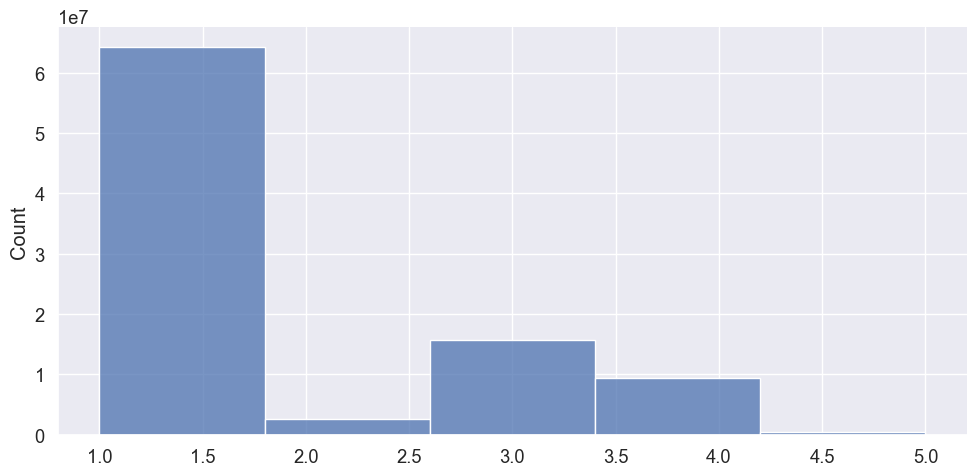

In [30]:
data = df_content_predictions.to_numpy().ravel().tolist()

sns.displot(
  data=data,
  kind='hist',
  aspect=2,
  bins=5,
)

In [31]:
# smoke test
orig_values = []
pred_values = []

for row in range(5):
    orig_ratings = df_utility_matrix_orig.iloc[row]
    pred_ratings = df_content_predictions.iloc[row]
    
    for col in range(len(orig_ratings)):
        orig_val = orig_ratings[col]
        if orig_val > 0:
            orig_values.append(orig_val)
            pred_values.append(pred)
            
            pred = pred_ratings[col]
            print(f'Original Value: {orig_val}. Prediction: {pred}')
    
    
# def mean_absolute_percentage_error(y_true, y_pred): 
#     y_true, y_pred = np.array(y_true), np.array(y_pred)
#     return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# print(orig_values)
# print(pred_values)

# print(mean_absolute_percentage_error(orig_values, pred_values))


NameError: name 'pred' is not defined

## Collaborative Filtering Recommender

In [46]:
find_and_print_values(df_utility_matrix)
df_utility_matrix

start of print
[]
[0.0177865612648221, -0.1225296442687747, 0.10474308300395259]
[-0.10416666666666669, 0.10416666666666669]
[0.02997720552867611, 0.06524409006026655, 0.06440233921851568, -0.15962363480745834]
[0.1875, 0.08333333333333337, 0.08333333333333326, 0.0625, 0.0625, -0.0625, -0.41666666666666663]
[0.06884920634920627, 0.14107142857142868, -0.1287698412698413, -0.08115079365079364]
[0.14880952380952386, -0.30654761904761907, -0.03571428571428578, 0.19345238095238096]
[0.004019474637681153, 0.1181499094202898, 0.20714447463768115, -0.3293138586956522]
[-0.1875, 0.1875]
[-0.2948482277526395, -0.16192967571644046, 0.23880561840120662, 0.21797228506787336]


,pQeaRpvuhoEqudo3uymHIQ,CsLQLiRoafpJPJSkNX2h5Q,lu7vtrp_bE9PnxWfA8g4Pg,vjTVxnsQEZ34XjYNS-XUpA,fnZrZlqW1Z8iWgTVDfv_MA,rVBPQdeayMYht4Uv_FOLHg,fhNf_sg-XzZ3e7HEVGuOZg,LoRef3ChgZKbxUio-sHgQg,Ga2Bt7xfqoggTypWD5VpoQ,xFc50drSPxXkcLvX5ygqrg,tLpkSwdtqqoXwU0JAGnApw,Sd75ucXKoZUM2BEfBHFUOg,lK-wuiq8b1TuU7bfbQZgsg,LAoSegVNU4wx4GTA8reB6A,-qjn24n8HYF6It9GQrQntw,ZkzutF0P_u0C0yTulwaHkA,0QjROMVW9ACKjhSEfHqNCQ,RrapAhd8ZxCj-iue7fu9FA,7j0kor_fkeYhyEpXh4OpnQ,OWkS1FXNJbozn-qPg3LWxg,j9bWpCRwpDVfwVT_V85qeA,6GHwgKNlvfIMUpFaxgBjUA,Ir_QIzs-4o9ElOtiGuxJrw,0Y5Kzo8PWHTjk0tlfAKcDQ,JcsZvx-4yovFgCXOfd6KMg,...,gVLzkqIAHIWro_ZxkpjbFg,GCen6oV-_6PfMP_uKN-dZw,P3dBcZh_Hmr1wVWFZn2b-g,2Wzet4CPV0glZYXqFGyqyg,XjrjVQfKpbcvOXda-5r1jQ,u1jADJ_yMcL8bRJre7hjMQ,VBCR0KKjFfzfcvV36KnkhA,02hhtAO83rZBU1hflleElA,6pKR-h3KN7AwgGOOYBbE2A,E50mr3xobsahb77IBRwVTQ,W1iwBUfcDxoOPfhwr6EOGQ,kw3DbQo6Pqo83FSDx8HQjQ,aGMU3qMFOQzG0DT2akMfng,1SJiW_mW6IlEe7hqMTnjYg,LkMtMHVetws5_7QfRjPtlg,2SfSzEd3B7WimeZac23zhg,1dV3qNEv8nNUAX1k3qdE2w,YHCseOJ93wJh0gBcii_2qA,TJt1W9haRm2DKuoZLQ69yA,wM8QNs7uSyDqMJKjBYFPCQ,gp_bu7Ah81qaBY3M0Leffw,PUKOr5bEI87TVHjwijT1xw,zV38gkkEeJ4cVRlSWWQTfQ,H1j34TgbrVZkxeww9xlJTw,F8M0IukXQqR50IRyocRQbg
user_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
UgMW8bLE0QMJDCkQ1Ax5Mg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
aq_ZxGHiri48TUXJlpRkCQ,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
jOERvhmK6_lo_XGUBPws_w,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2hRe26HSCAWbFRn5WChK-Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
A0j21z2Q1HGic7jW6e9h7A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TWt_hQXobwWMPpQVoEvanA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4rwyBw1cK2AsDfcJGkCiRQ,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
uav6nwbBCZTqCG_W4FiceA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [85]:
# choose only 10 users from the priginal data set
ratings_orig = df_utility_matrix_orig.T
ratings_orig.rename(index={'user_id': 'business_id'})
ratings_orig = ratings_orig.fillna(0)
ratings_orig

user_id,UgMW8bLE0QMJDCkQ1Ax5Mg,aq_ZxGHiri48TUXJlpRkCQ,jOERvhmK6_lo_XGUBPws_w,2hRe26HSCAWbFRn5WChK-Q,A0j21z2Q1HGic7jW6e9h7A,XivuRnPq3D-K5cPiBTztIA,H3wPBzQCKCKiHcV7GZK4kg,6UR0kNe3C-ivlF2x1fPHNQ,FmQxARdHGnkclvcVWGEAxw,fVILhIglx6RNOXQba5t4kQ,HLaSqQMDVvlcFPGJL_kGCA,lMIm1Ye7BeVE21xqlImqEw,2VRkBZBS5FO_N7yBRWfaLA,ffMc-TmUUhEbj5LLNILB4A,4wp4XI9AxKNqJima-xahlg,4FnosmTZU4Kq3110Ykt7ZA,LPva2snYp0Fdu8Z1QIXLiA,XBRgHoPjOi4GgcYFCvYElQ,1kNsEAhGU8d8xugMuXJGFA,pvXNlamX78K_fQVUz8C3sw,uLWWpi62JJLnTh7UciJFHg,q3ycagiLqUaRkOgEPf_gbw,aLqp_fe64ugZFuwMpsXLiw,3PnzCtO4eEagc9vq9rZGNw,fFFTeVrZfTWuvbJXNKb-vQ,...,qSJfAPjmTAaySpTAbmJTcw,p2lIWB4wG1kiOh14yeb02A,LB_dvaFy7Iv8RdLv4POYPQ,HazhiiY8LOS-x6CNApyGjQ,dRJbnB-oiaEZuMkWXtIadA,ZjGIVq4px2PsOU9uzETakg,670k6Gr6V4VqLIKtVEmDuQ,u25VYsrsieQjIIzdonZ91A,gFywTKNZObGpky_usYXZcA,TzxneosIW_7vLIeVCVrhVw,2xNmAtzXfJEeypWbt9o-bA,URb6znpCCVzd1kZvugedwg,6WpmSCTUGV6W7v01TWp9Sw,lco3gaENgH96r-_EH2Uk3w,cntYY9TAsK8gLccAVmLK9Q,IDjIyzuFfxF_vb2Rn_GFMw,pA8Q4djhX7vkjA4n9GIWWg,AsSz6hfCcgICRCBOaot3Rw,Z9Qw9C78qu3JC_qEcUh8aw,2m14CEXaClD9Fef4i-V-tw,TWt_hQXobwWMPpQVoEvanA,4rwyBw1cK2AsDfcJGkCiRQ,uav6nwbBCZTqCG_W4FiceA,XGufJ5VHHUr2uv2RJt9E9Q,ts364JSfveX9T4oX2NMydQ
pQeaRpvuhoEqudo3uymHIQ,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
CsLQLiRoafpJPJSkNX2h5Q,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
lu7vtrp_bE9PnxWfA8g4Pg,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
vjTVxnsQEZ34XjYNS-XUpA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
fnZrZlqW1Z8iWgTVDfv_MA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
gp_bu7Ah81qaBY3M0Leffw,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
PUKOr5bEI87TVHjwijT1xw,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
zV38gkkEeJ4cVRlSWWQTfQ,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
H1j34TgbrVZkxeww9xlJTw,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [86]:
from sklearn.neighbors import NearestNeighbors

# find the nearest neighbors using NearestNeighbors(n_neighbors=3)
number_neighbors = 3
knn = NearestNeighbors(metric='cosine', algorithm='brute')
knn.fit(ratings.values)
distances, indices = knn.kneighbors(ratings.values, n_neighbors=number_neighbors)

In [88]:
distances

array([[1., 1., 1.],
       [1., 1., 1.],
       [1., 1., 1.],
       ...,
       [0., 0., 0.],
       [1., 1., 1.],
       [1., 1., 1.]])

In [89]:
ratings = ratings_orig.copy()

# convert user_name to user_index
user_index = ratings.columns.tolist().index('UgMW8bLE0QMJDCkQ1Ax5Mg')

for row_number, title in list(enumerate(ratings.index)):
    # find movies without ratings by the user
    if ratings.iloc[row_number, user_index] == 0:
        sim_movies = indices[row_number].tolist()
        movie_distances = distances[row_number].tolist()

        # Generally, this is the case: indices[3] = [3 6 7]. The movie itself is in the first place.
        # In this case, we take off 3 from the list. Then, indices[3] == [6 7] to have the nearest NEIGHBORS in the list. 
        if row_number in sim_movies:
            id_movie = sim_movies.index(row_number)
            sim_movies.remove(row_number)
            movie_distances.pop(id_movie) 

        # However, if the percentage of ratings in the dataset is very low, there are too many 0s in the dataset. 
        # Some movies have all 0 ratings and the movies with all 0s are considered the same movies by NearestNeighbors(). 
        # Then,even the movie itself cannot be included in the indices. 
        # For example, indices[3] = [2 4 7] is possible if movie_2, movie_3, movie_4, and movie_7 have all 0s for their ratings.
        # In that case, we take off the farthest movie in the list. Therefore, 7 is taken off from the list, then indices[3] == [2 4].
        else:
            sim_movies = sim_movies[:number_neighbors-1]
            movie_distances = movie_distances[:number_neighbors-1]

        # movie_similarty = 1 - movie_distance    
        movie_similarity = [1-x for x in movie_distances]
        movie_similarity_copy = movie_similarity.copy()
        nominator = 0

        # for each similar movie
        for similar_movie in range(0, len(movie_similarity)):
            # check if the rating of a similar movie is zero
            if ratings.iloc[sim_movies[similar_movie], user_index] == 0:
                # if the rating is zero, ignore the rating and the similarity in calculating the predicted rating
                if len(movie_similarity_copy) == (number_neighbors - 1):
                    movie_similarity_copy.pop(similar_movie)
                else:
                    movie_similarity_copy.pop(similar_movie-(len(movie_similarity)-len(movie_similarity_copy)))

            # if the rating is not zero, use the rating and similarity in the calculation
            else:
                nominator = nominator + movie_similarity[similar_movie]*df.iloc[sim_movies[similar_movie], user_index]

    # check if the number of the ratings with non-zero is positive
    if len(movie_similarity_copy) > 0:
      
        # check if the sum of the ratings of the similar movies is positive.
        if sum(movie_similarity_copy) > 0:
            predicted_r = nominator/sum(movie_similarity_copy)

        # Even if there are some movies for which the ratings are positive, some movies have zero similarity even though they are selected as similar movies.
        # in this case, the predicted rating becomes zero as well  
        else:
            predicted_r = 0

    # if all the ratings of the similar movies are zero, then predicted rating should be zero
    else:
        predicted_r = 0

    # place the predicted rating into the copy of the original dataset
    print(predicted_r)
    ratings_orig.iloc[row_number, user_index] = predicted_r


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


In [91]:
ratings

user_id,UgMW8bLE0QMJDCkQ1Ax5Mg,aq_ZxGHiri48TUXJlpRkCQ,jOERvhmK6_lo_XGUBPws_w,2hRe26HSCAWbFRn5WChK-Q,A0j21z2Q1HGic7jW6e9h7A,XivuRnPq3D-K5cPiBTztIA,H3wPBzQCKCKiHcV7GZK4kg,6UR0kNe3C-ivlF2x1fPHNQ,FmQxARdHGnkclvcVWGEAxw,fVILhIglx6RNOXQba5t4kQ,HLaSqQMDVvlcFPGJL_kGCA,lMIm1Ye7BeVE21xqlImqEw,2VRkBZBS5FO_N7yBRWfaLA,ffMc-TmUUhEbj5LLNILB4A,4wp4XI9AxKNqJima-xahlg,4FnosmTZU4Kq3110Ykt7ZA,LPva2snYp0Fdu8Z1QIXLiA,XBRgHoPjOi4GgcYFCvYElQ,1kNsEAhGU8d8xugMuXJGFA,pvXNlamX78K_fQVUz8C3sw,uLWWpi62JJLnTh7UciJFHg,q3ycagiLqUaRkOgEPf_gbw,aLqp_fe64ugZFuwMpsXLiw,3PnzCtO4eEagc9vq9rZGNw,fFFTeVrZfTWuvbJXNKb-vQ,...,qSJfAPjmTAaySpTAbmJTcw,p2lIWB4wG1kiOh14yeb02A,LB_dvaFy7Iv8RdLv4POYPQ,HazhiiY8LOS-x6CNApyGjQ,dRJbnB-oiaEZuMkWXtIadA,ZjGIVq4px2PsOU9uzETakg,670k6Gr6V4VqLIKtVEmDuQ,u25VYsrsieQjIIzdonZ91A,gFywTKNZObGpky_usYXZcA,TzxneosIW_7vLIeVCVrhVw,2xNmAtzXfJEeypWbt9o-bA,URb6znpCCVzd1kZvugedwg,6WpmSCTUGV6W7v01TWp9Sw,lco3gaENgH96r-_EH2Uk3w,cntYY9TAsK8gLccAVmLK9Q,IDjIyzuFfxF_vb2Rn_GFMw,pA8Q4djhX7vkjA4n9GIWWg,AsSz6hfCcgICRCBOaot3Rw,Z9Qw9C78qu3JC_qEcUh8aw,2m14CEXaClD9Fef4i-V-tw,TWt_hQXobwWMPpQVoEvanA,4rwyBw1cK2AsDfcJGkCiRQ,uav6nwbBCZTqCG_W4FiceA,XGufJ5VHHUr2uv2RJt9E9Q,ts364JSfveX9T4oX2NMydQ
pQeaRpvuhoEqudo3uymHIQ,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
CsLQLiRoafpJPJSkNX2h5Q,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
lu7vtrp_bE9PnxWfA8g4Pg,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
vjTVxnsQEZ34XjYNS-XUpA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
fnZrZlqW1Z8iWgTVDfv_MA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
gp_bu7Ah81qaBY3M0Leffw,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
PUKOr5bEI87TVHjwijT1xw,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
zV38gkkEeJ4cVRlSWWQTfQ,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
H1j34TgbrVZkxeww9xlJTw,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [92]:
def recommend_movies(user, num_recommended_movies):
    print('The list of the Movies {} Has Watched \n'.format(user))

    for m in ratings_orig[ratings_orig[user] > 0][user].index.tolist():
        print(m)

    print('\n')

    recommended_movies = []

    for m in ratings_orig[ratings_orig[user] == 0].index.tolist():
        index_df = ratings_orig.index.tolist().index(m)
        predicted_rating = ratings.iloc[index_df, ratings.columns.tolist().index(user)]
        recommended_movies.append((m, predicted_rating))

    sorted_rm = sorted(recommended_movies, key=lambda x:x[1], reverse=True)

    print('The list of the Recommended Movies \n')
    rank = 1
    for recommended_movie in sorted_rm[:num_recommended_movies]:
        print('{}: {} - predicted rating:{}'.format(rank, recommended_movie[0], recommended_movie[1]))
        rank = rank + 1

In [93]:
recommend_movies('UgMW8bLE0QMJDCkQ1Ax5Mg', 7)

The list of the Movies UgMW8bLE0QMJDCkQ1Ax5Mg Has Watched 



The list of the Recommended Movies 

1: 3ViGD_AF1AUmxF4zeHB_kQ - predicted rating:5
2: VIG1MhUSl5FFBJ1KtCFqBg - predicted rating:5
3: IS4cv902ykd8wj1TR0N3-A - predicted rating:4
4: _t8B7bb-Q7kmn50kvGEKzw - predicted rating:4
5: blBZJ_UbVb2ieOcktYRuZg - predicted rating:4
6: QoKn3zRpDrBj3hCPYGDCSA - predicted rating:3
7: TyMy57LU8KsyWduCRFiRdQ - predicted rating:2


In [ ]:
def predict_collaborative_ratings(utility_matrix: pd.DataFrame) -> pd.DataFrame:
    # TODO: User-item collaborative filtering based rating prediction (15 points)
    # TODO: UV-decomposition based rating prediction (optional for 10 extra points)
    pass

df_collaborative_predictions = predict_collaborative_ratings(df_utility_matrix)

## Evaluation

In [ ]:
def score_model(utility_matrix: pd.DataFrame, predicted_utility_matrix: pd.DataFrame, model_name="model_0"):
    # TODO: Implement these by hand (each metric 1 point)
    rmse_score = 0
    map_score = 0
    coverage_score = 0
    personalization_score = 0
    intra_list_similarity_score = 0
    
    print("{} RMSE {}".format(model_name, rmse_score))
    print("MAP: {}".format(model_name, map_score))
    print("Coverage: {}".format(model_name, coverage_score))
    print("Personalization: {}".format(model_name, personalization_score))
    print("Intra-list similarity: {}".format(model_name, intra_list_similarity_score))    

score_model(df_content_predictions, df_utility_matrix, "content-based approach")
score_model(df_collaborative_predictions, df_utility_matrix, "collaborative-filtering approach")

## Constraint Satisfaction Problem

We can work with the task of planing breakfast, lunch and dinner for particular user as Constraint Satisfaction Problem with

**Domain**: {all_businesses}

**Variables**: {breakfast, lunch, dinner}

**Constraints**: {constrainst regarding individual variable, or several variables at once}

We also have predicted ratings for every business and want to have personalized plan of restaurants. So we won't only satisfy our constraints, but also would like to get the maximum cumulative rating.

Take a look on prepared constraints and finish empty constraints in similar way (some of these constraints may require analytics on business data. e.g. to finish **has_coffee_constraint** you may need to determine all the categories which may include good coffee in their menu)

In [ ]:
def is_vegetarian_constraint(business_id):
    return "vegetarian" in df_yelp_business[df_yelp_business["business_id"] == business_id].categories.values[0].lower()

def has_coffee_constraint(business_id):
    # TODO: implement this constraint (1 point)
    return False

def has_alcohol_constraint(business_id):
    # TODO: implement this constraint (1 point)
    return False

def is_open_constraint(business_id):
    # TODO: implement this constraint (1 point)
    return False

def is_open_at_date_at_time_meta_constraint(weekday, time, business_id):
    # TODO: implement this constraint (1 point)
    return False

def is_open_at_monday_at_10am_constraint(business_id):
    return is_open_at_date_at_time("monday", "10:00", business_id)

def all_are_different_constraint(state):
    for time in ["breakfast", "dinner", "lunch"]:
        for _t in ["breakfast", "dinner", "lunch"]:
            if time == _t: continue
            business_categories = set(df_yelp_business[df_yelp_business["business_id"] == state[time]["business_id"]].categories.values[0].split(","))
            _business_categories = set(df_yelp_business[df_yelp_business["business_id"] == state[_t]["business_id"]].categories.values[0].split(","))
            if len(business_categories.intersection(_business_categories)) > \
                    len(business_categories.union(_business_categories)) // 2:
                return False
    return True

def all_are_in_the_same_city_constraint(state):
    # TODO: implement this constraint (1 point)
    return False

def all_are_in_the_same_region_meta_constraint(coordinates, threshold, state):
    # TODO: implement this constraint (1 point). Hint: use haversine distance https://pypi.org/project/haversine/
    return False

def all_are_in_test_region(state):
    return all_are_in_the_same_region_constraint({"lat": 40.110446, "lon": -115.301568}, 400, state)

def at_least_one_visited_place_constraint(state):
    # TODO: implement this constraint (2 points)
    # Make this constraint give more reward for more than one familiar place
    return False

def at_least_one_has_coffee_constraint(state):
    # TODO: implement this constraint (2 points)
    # Make this constraint give more reward for more than one place with coffee
    return False

In [ ]:
import random 

random.seed(42)
inspected_user = random.choice(df_yelp_reviews["user_id"].unique())

all_constraints = {
    "breakfast": [has_coffee_constraint, is_open_constraint, is_open_at_monday_at_10am_constraint],
    "lunch": [is_open_constraint],
    "dinner": [is_vegetarian_constraint, has_alcohol_constraint, is_open_constraint],
    "state": [at_least_one_has_coffee_constraint, at_least_one_visited_place_constraint, all_are_in_test_region,
             all_are_in_the_same_city_constraint, all_are_different_constraint]
}

def goal_test(state: dict, constraints: dict):
    cumulative_rating = state["breakfast"]["predicted_rating"]*state["lunch"]["predicted_rating"]*\
                        state["dinner"]["predicted_rating"]
    for k in constraints.keys():
        if k == "state":
            for c in constraints[k]:
                cumulative_rating *= c(state)
        else:
            for c in constraints[k]:
                cumulative_rating *= c(state[k]["business_id"])
    return cumulative_rating


def prepare_restaurants_plan(user_id: str, user_business_ratings: pd.DataFrame, constraints: dict):
    # TODO: assign breakfast, lunch and dinner by solving Constraint Satisfaction Problem 
    # maximizing total score and satisfying all the constraints (it should work with any configuration of constraints)
    
    # You can implement Backtracking (10) + Filtering (10) + Ordering (5) using goal_test
    # OR
    # Local Search (10) + Min-Conflicts heuristic (10) + Ordering (5) with modification of goal test to work as Min-Conflicts heuristic
    
    state = {"user_id" : user_id,
        "breakfast": 
                {"business_id": random.choice(user_business_ratings["business_id"].unique()),
                 "predicted_rating": 0},
            "lunch": 
    {"business_id": random.choice(user_business_ratings["business_id"].unique()),
                 "predicted_rating": 0},
            "dinner": {"business_id": random.choice(user_business_ratings["business_id"].unique()),
                 "predicted_rating": 0}}
    
    state_v = goal_test(state, constraints)

    
    return state

# TODO: replace df_utility_matrix with your best predictions
prepare_restaurants_plan(inspected_user, df_utility_matrix, all_constraints)